# Topic Modelling using LDA and NMF

### Necessary imports
- using sklearn implementation of LDA and NMF

In [1]:
import pandas as pd
import pickle

import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF
import matplotlib.pyplot as plt


In [2]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
import gensim


- texts were previously saved into a dataframe

In [3]:
texts_df = pd.read_pickle('input_files/texts.pk')


In [4]:
texts_df

,date,text
0,1703-08-08,Anmerckung demnach schon geraum Zeit hero viel...
1,1703-08-13,Auss biss Land Militz Oesterreich auffgebot th...
2,1703-08-17,Auss Biss verfügten dess Morgen Königliche Ma ...
3,1703-08-20,Auss biss Alss Fest Mari Himmelfahrt begeben K...
4,1703-11-19,Biss verfügen Römische König Römische Königin ...
...,...,...
293,1796-06-18,us Jnländische Begebenheit verdienstvollen ver...
294,1798-09-22,allergnädigst Freiheit weniger Tag nachstehend...
295,1798-09-26,N ro allergnä digst Freiheit Jnländische Begeb...
296,1798-09-29,allergnädigst Freiheit Jnländische Begebenheit...


In [5]:
texts_df.columns

Index(['date', 'text'], dtype='object')

In [6]:
vectorizer = TfidfVectorizer()  
vectorized_text = vectorizer.fit_transform(texts_df['text'])

In [9]:
feature_names = vectorizer.get_feature_names_out()


- after some experimentation, settled for 50 topics

In [7]:
num_topics = 50


In [8]:
vectorized_text

<298x134236 sparse matrix of type '<class 'numpy.float64'>'
	with 674430 stored elements in Compressed Sparse Row format>

### Training and saving LDA model 

In [10]:
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(vectorized_text)

LatentDirichletAllocation(n_components=50, random_state=42)

In [15]:
with open('models/lda_model.pkl', 'wb') as f:
    pickle.dump(lda, f)

### Training and saving NMF model 

In [17]:
nmf = NMF(n_components=num_topics, random_state=42)
nmf.fit(vectorized_text)


C:\Users\krusic\Anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(
C:\Users\krusic\Anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:1637: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


NMF(n_components=50, random_state=42)

In [18]:
with open('models/nmf_model.pkl', 'wb') as f:
    pickle.dump(nmf, f)

# Visualisations of topics (LDA and NMF)

In [14]:
feature_names = vectorizer.get_feature_names_out()


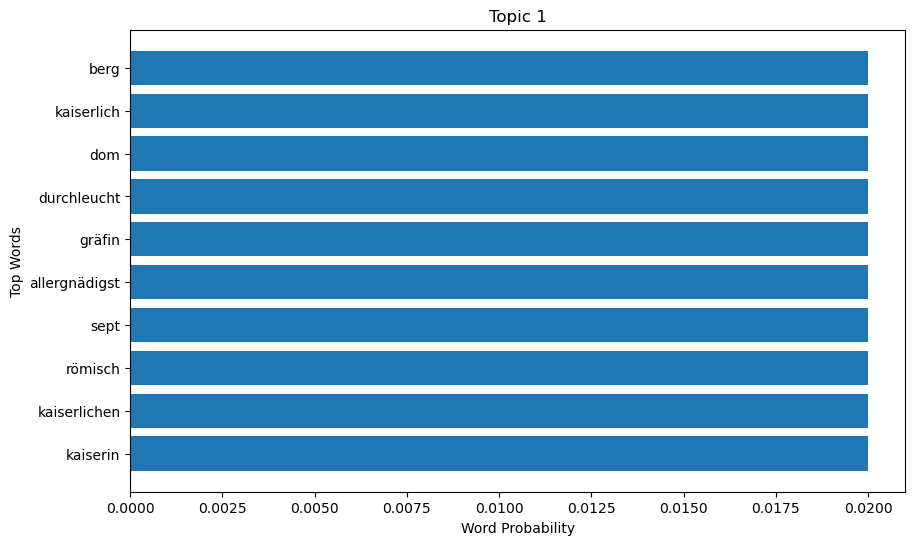

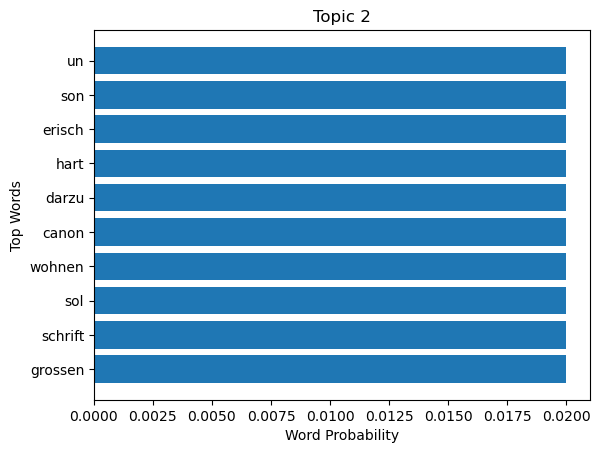

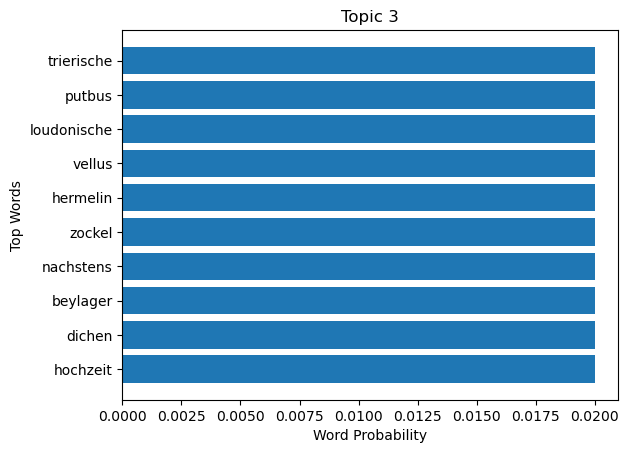

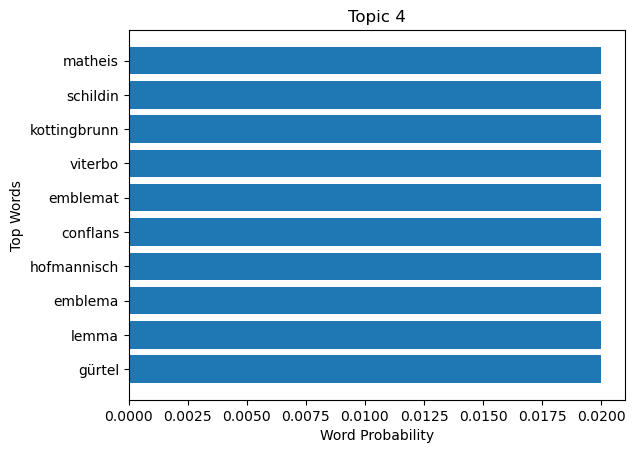

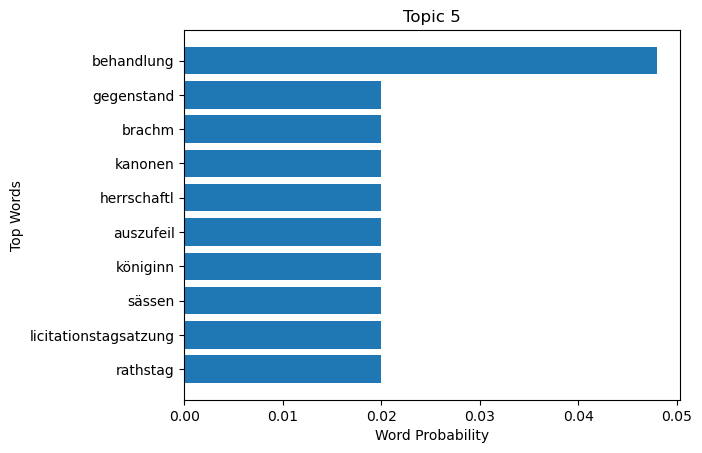

...

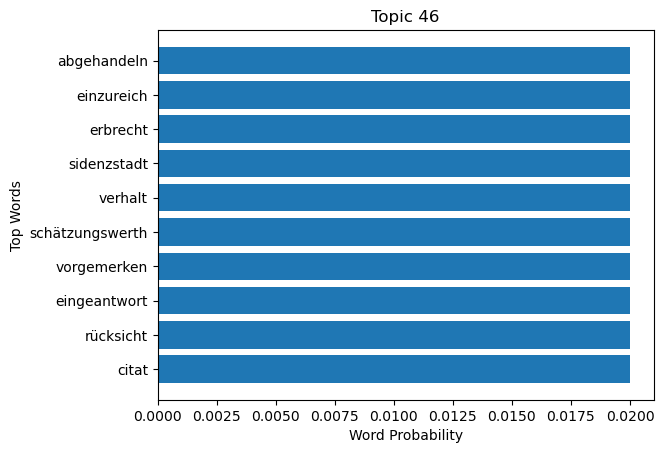

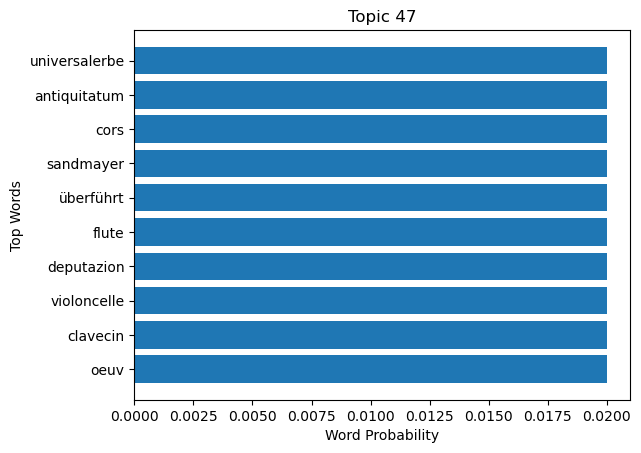

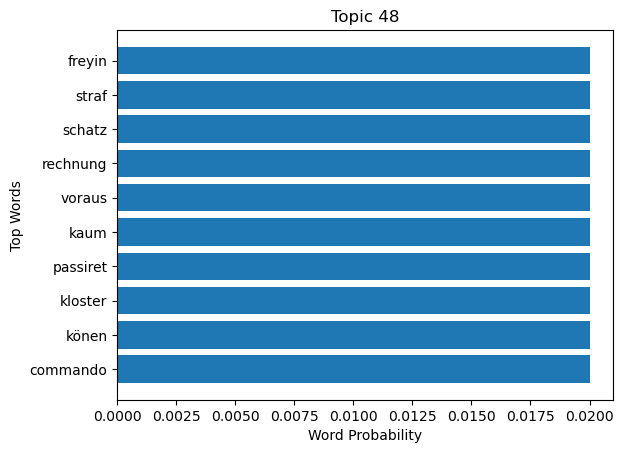

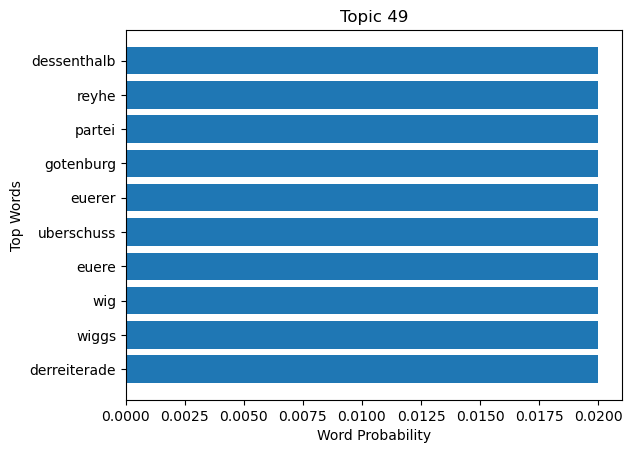

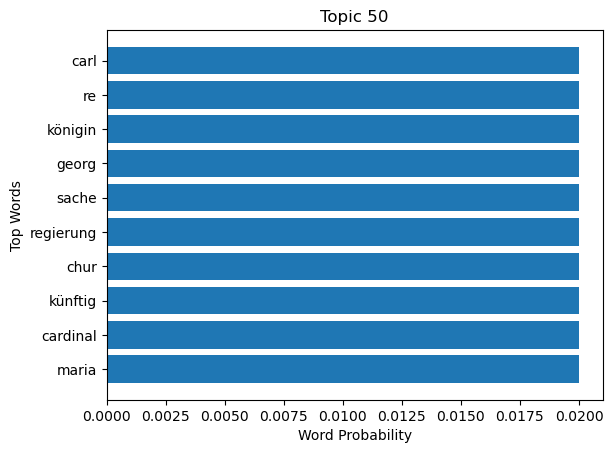

In [15]:
plt.figure(figsize=(10, 6))
for topic_idx, topic in enumerate(lda.components_):
    top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]]
    plt.barh(top_words, topic[:-11:-1])
    plt.title(f"Topic {topic_idx+1}")
    plt.xlabel("Word Probability")
    plt.ylabel("Top Words")
    plt.show()


Topic 1:


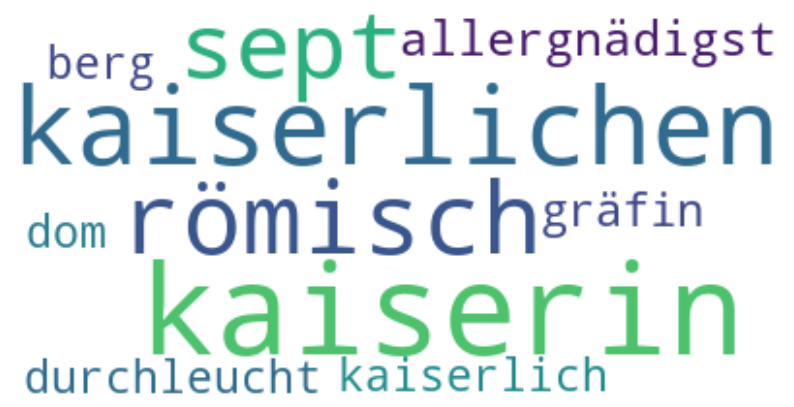

Topic 2:


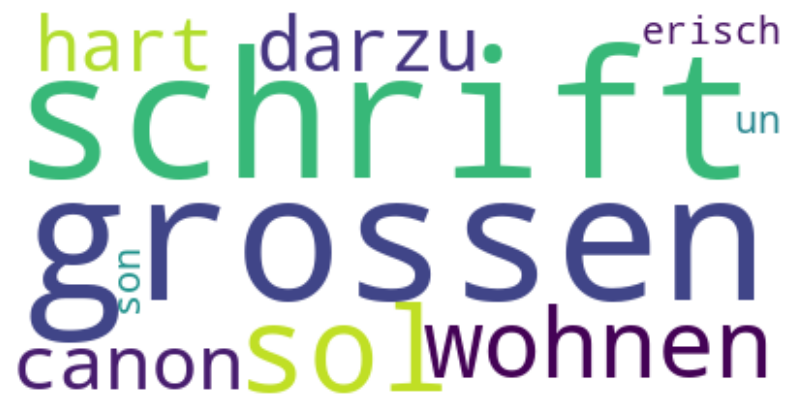

Topic 3:


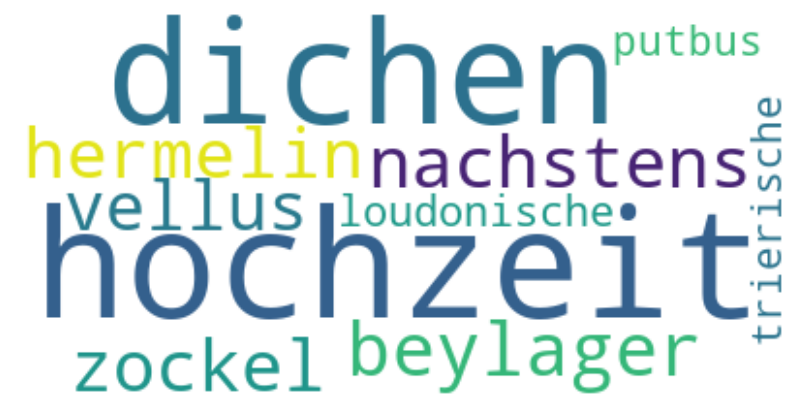

Topic 4:


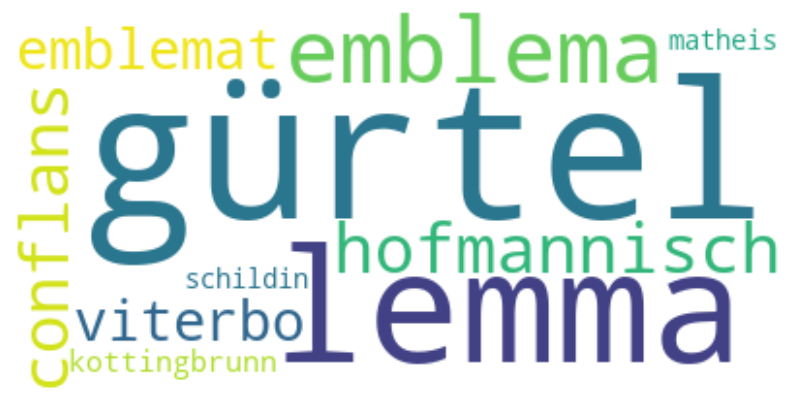

Topic 5:


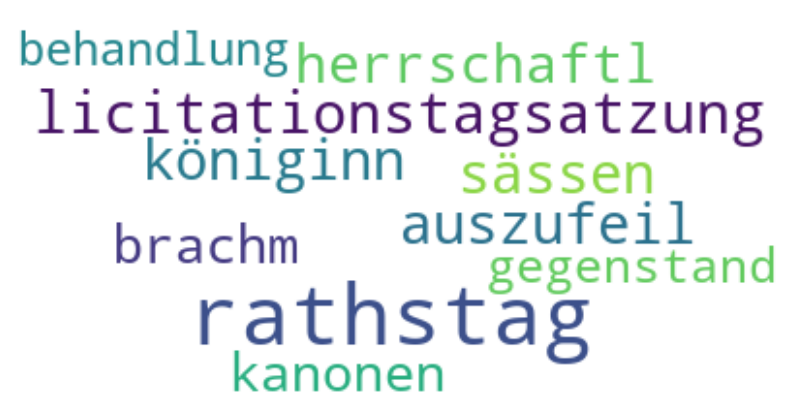

Topic 6:


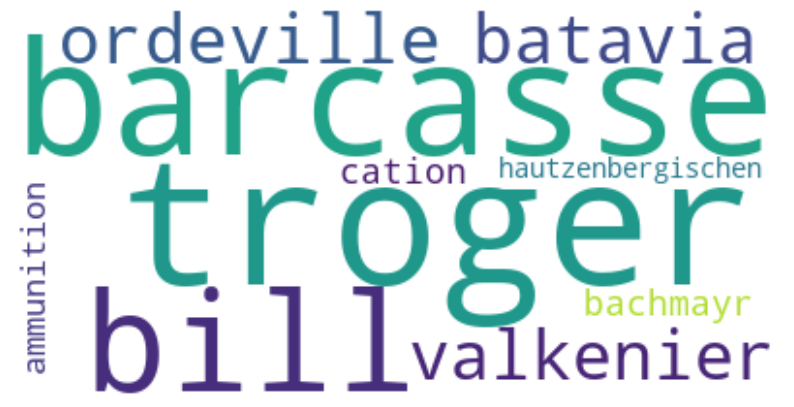

Topic 7:


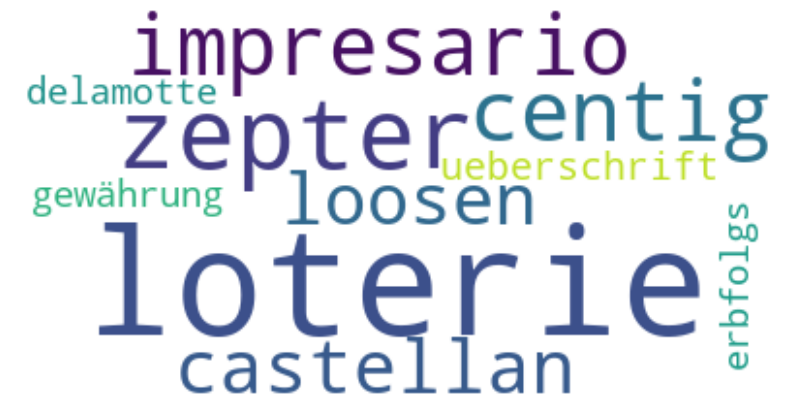

Topic 8:


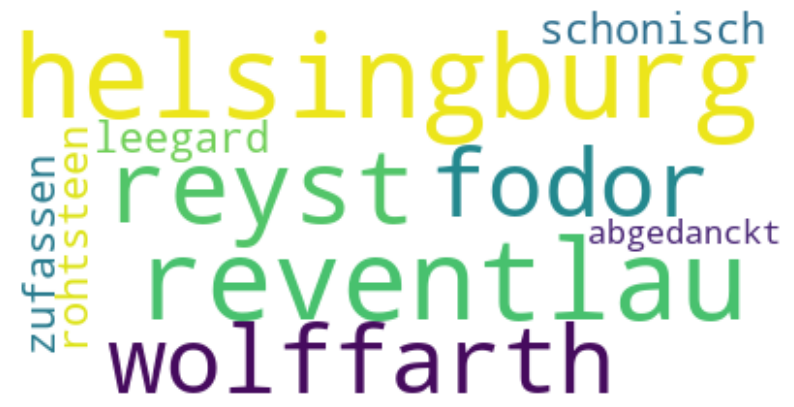

Topic 9:


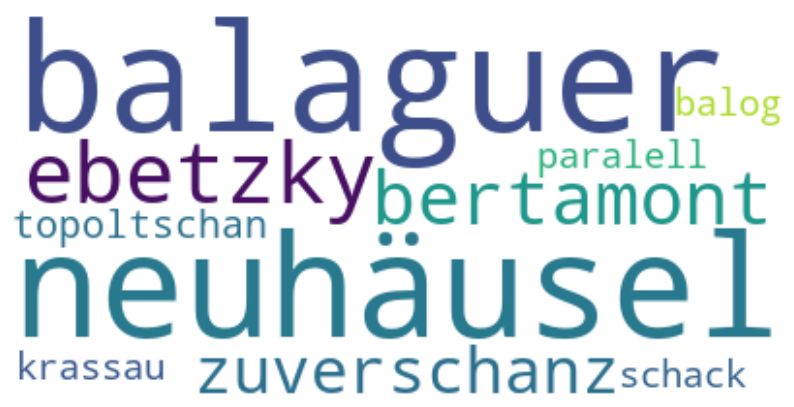

Topic 10:


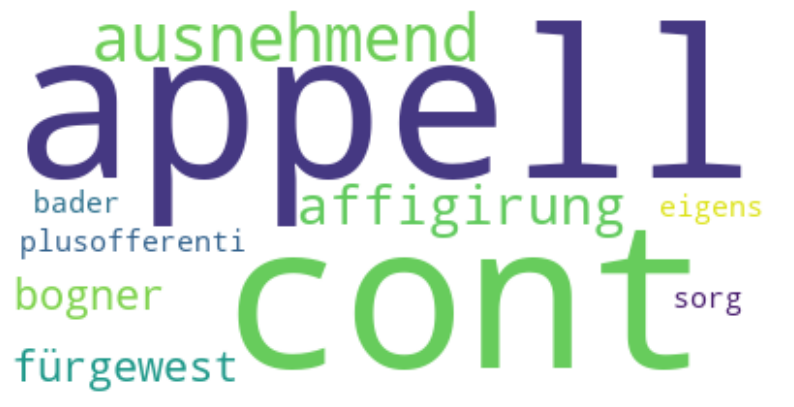

Topic 11:


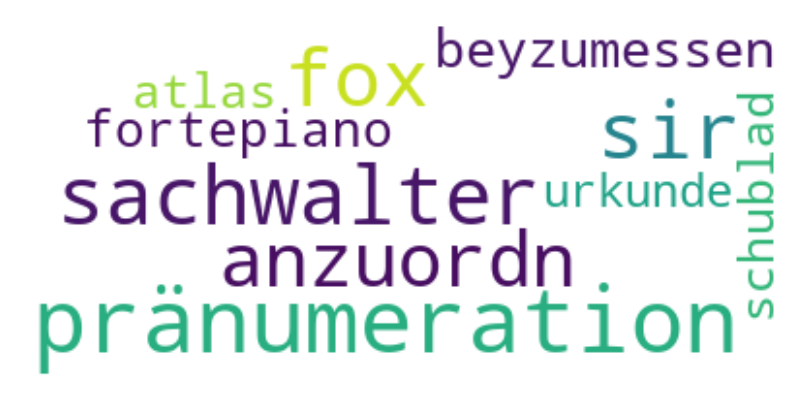

Topic 12:


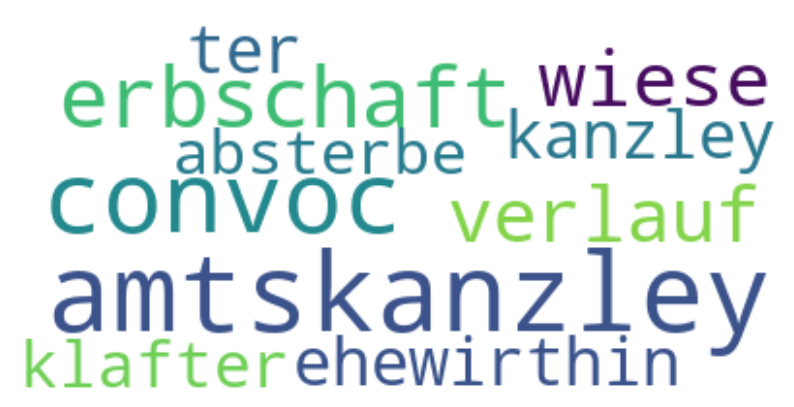

Topic 13:


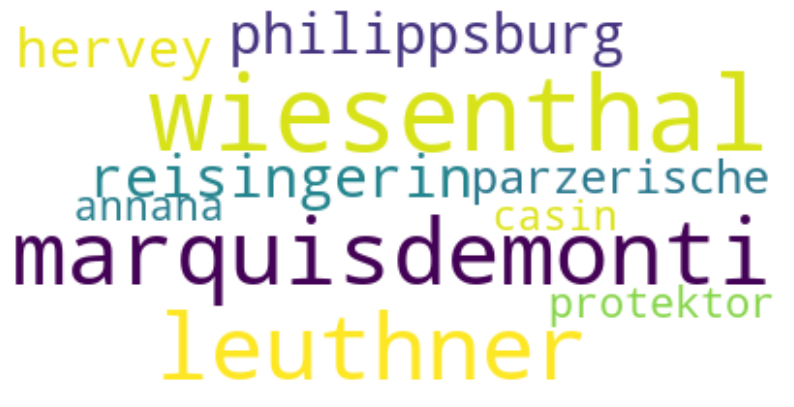

Topic 14:


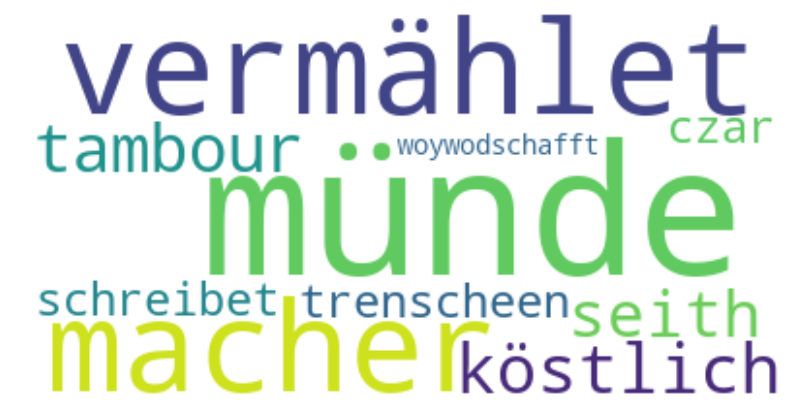

Topic 15:


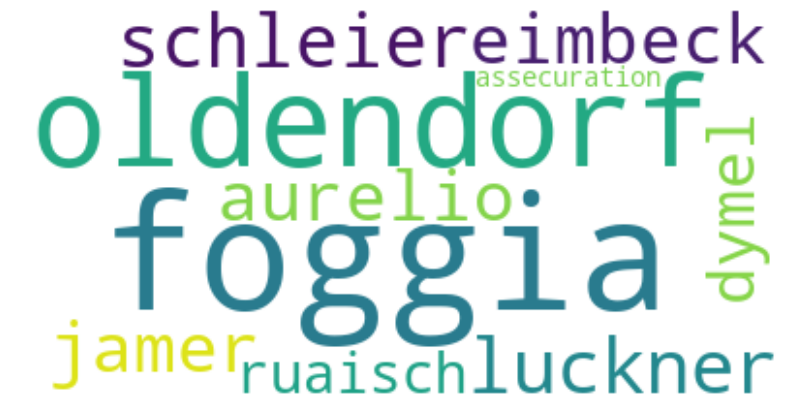

Topic 16:


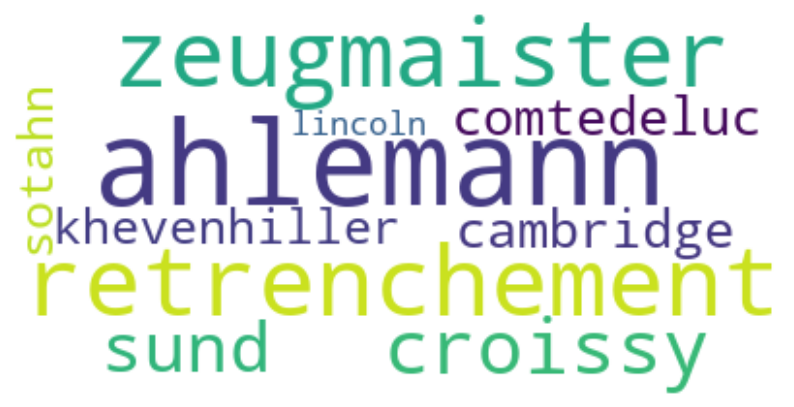

Topic 17:


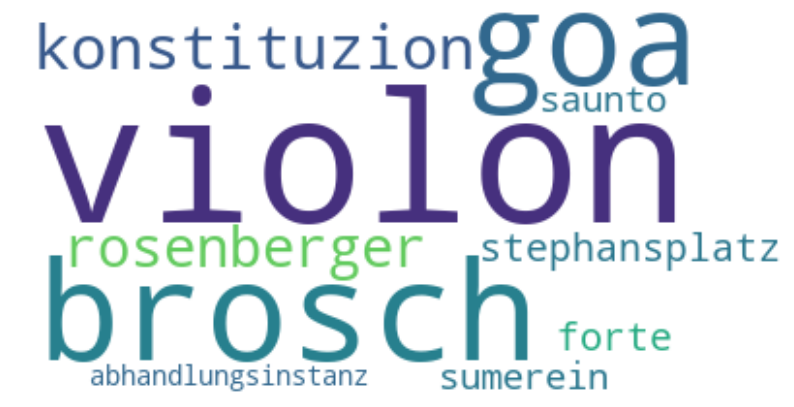

Topic 18:


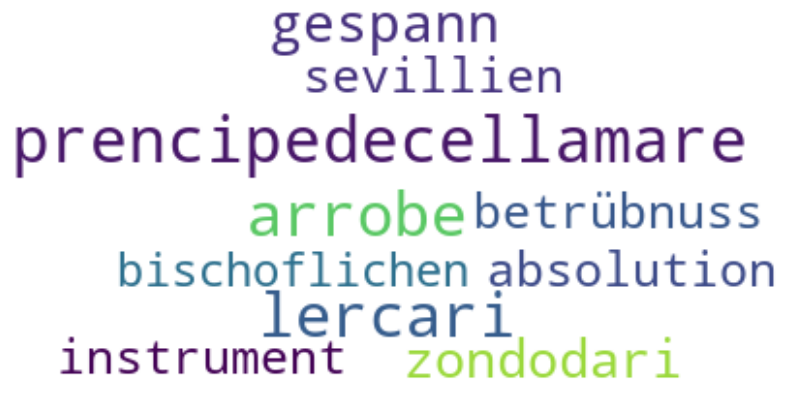

Topic 19:


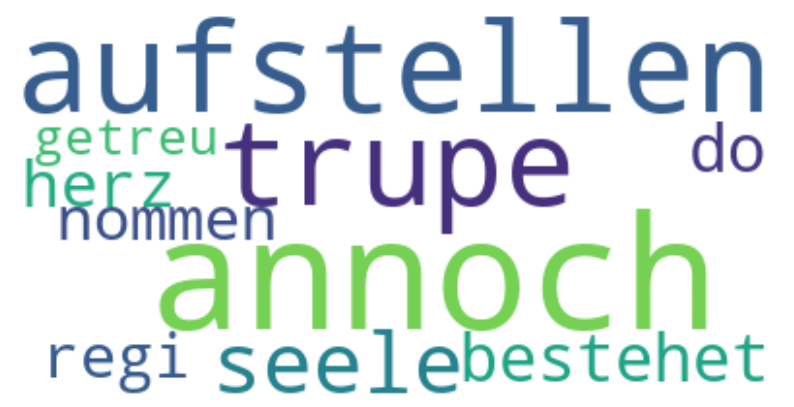

Topic 20:


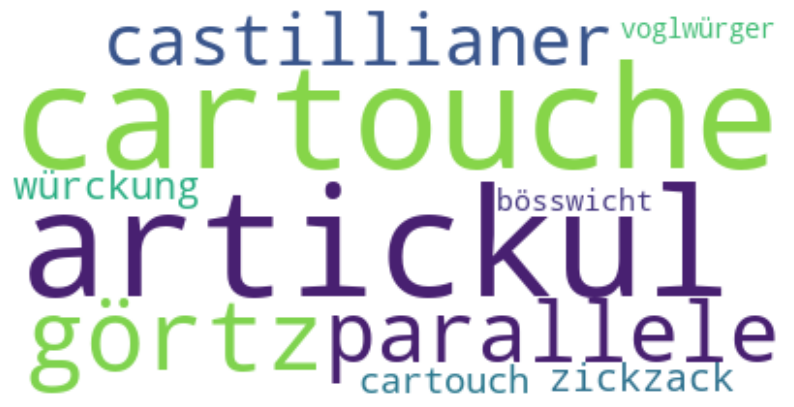

Topic 21:


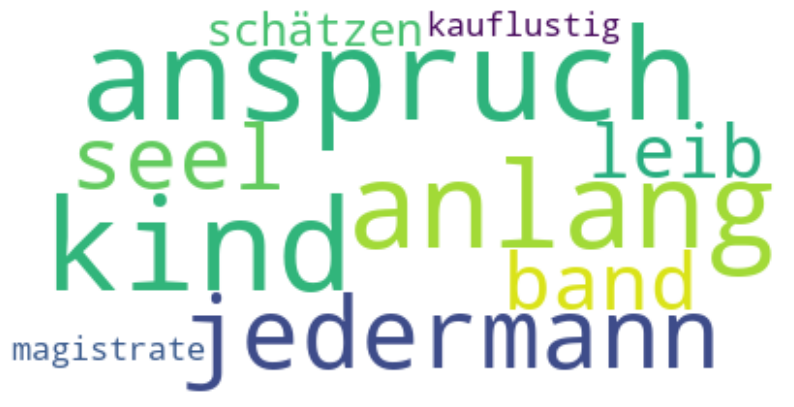

Topic 22:


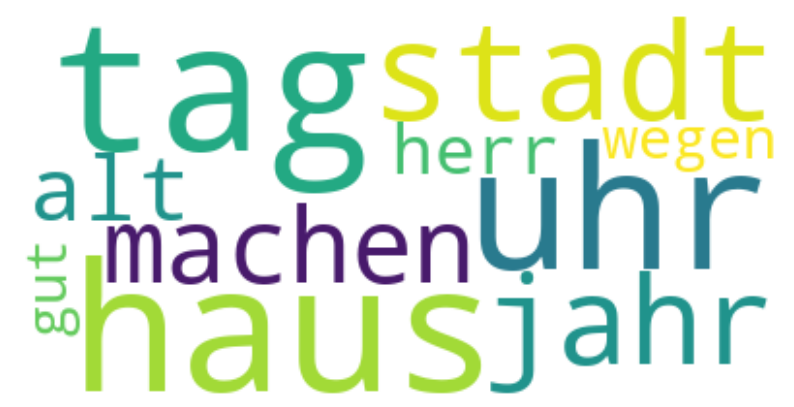

Topic 23:


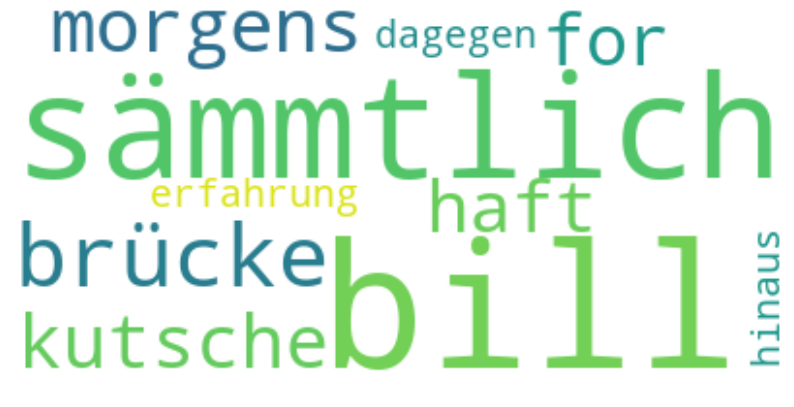

Topic 24:


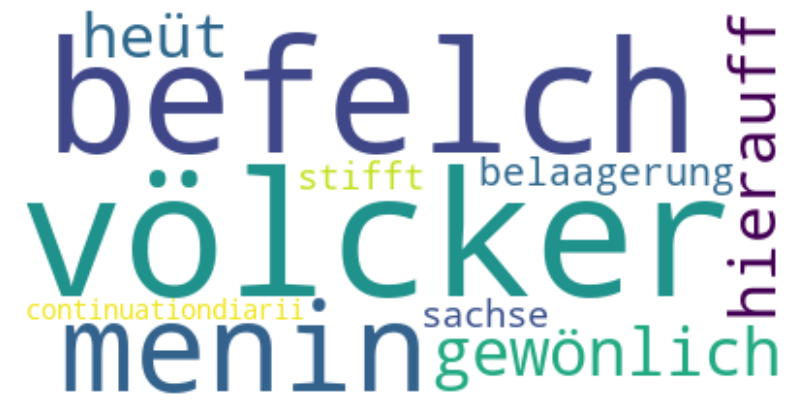

Topic 25:


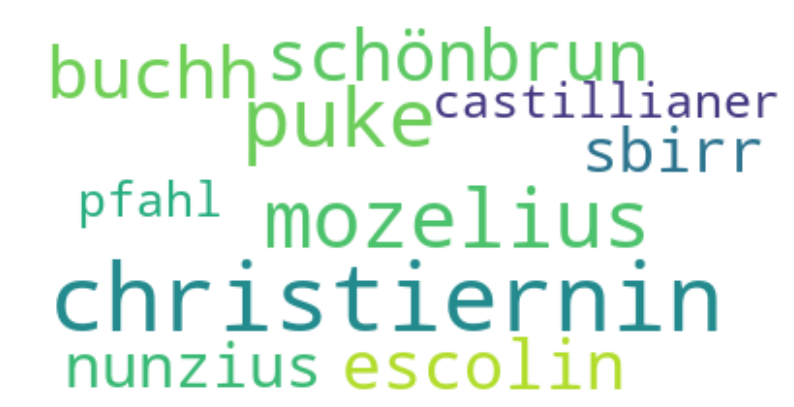

Topic 26:


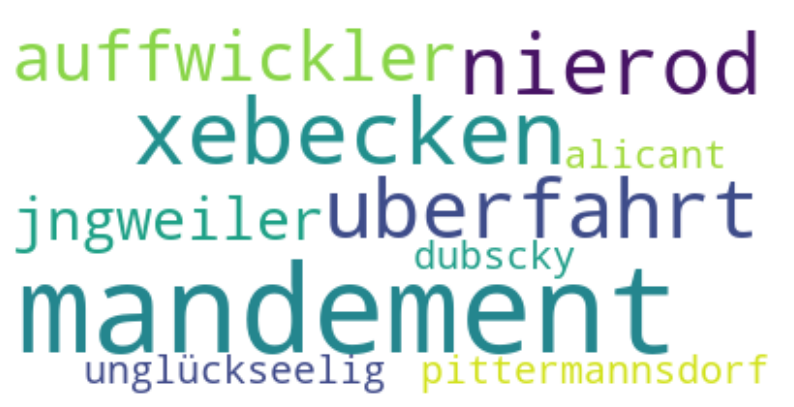

Topic 27:


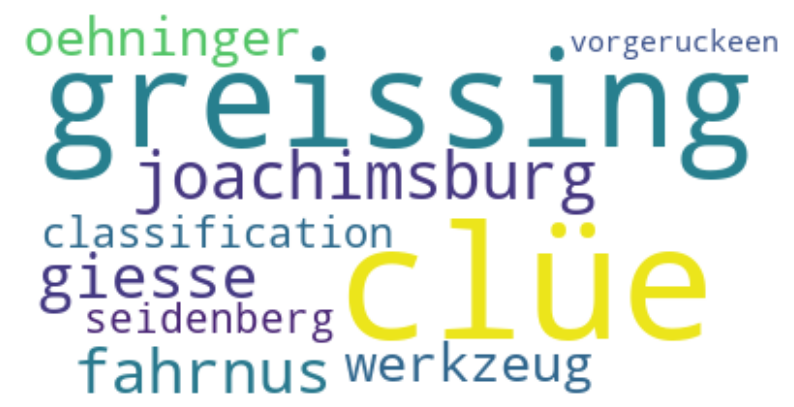

Topic 28:


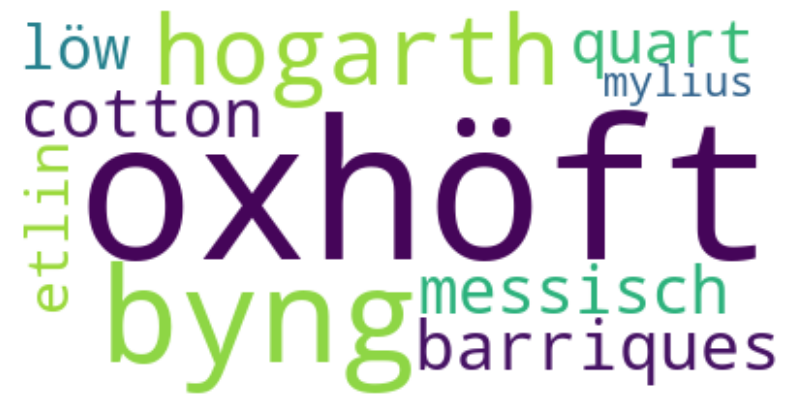

Topic 29:


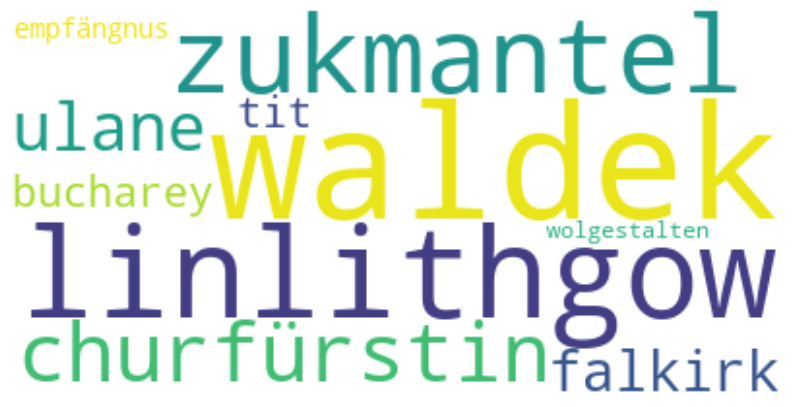

Topic 30:


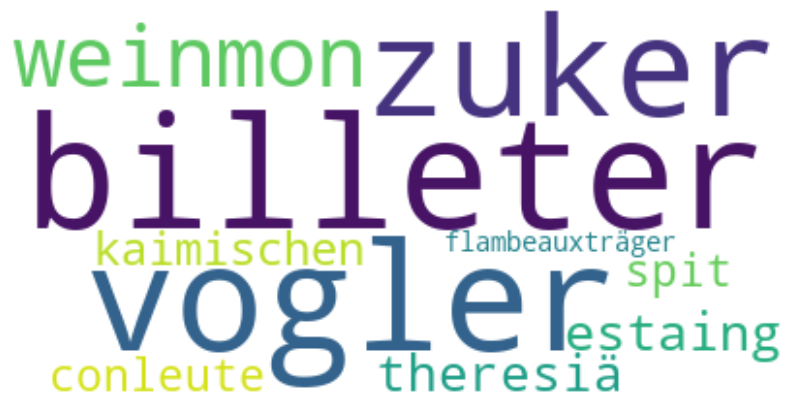

Topic 31:


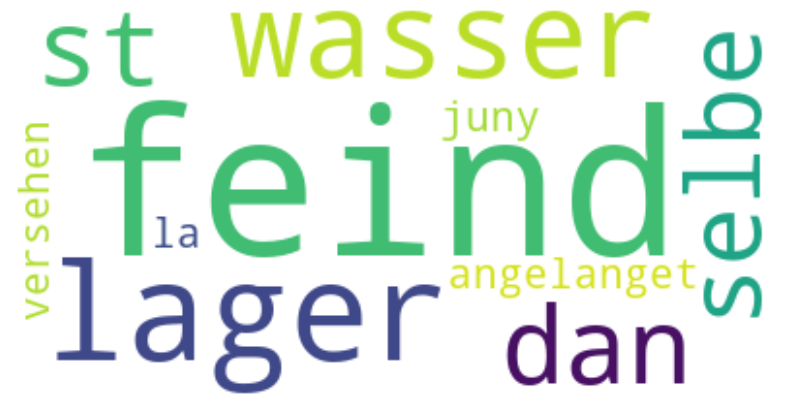

Topic 32:


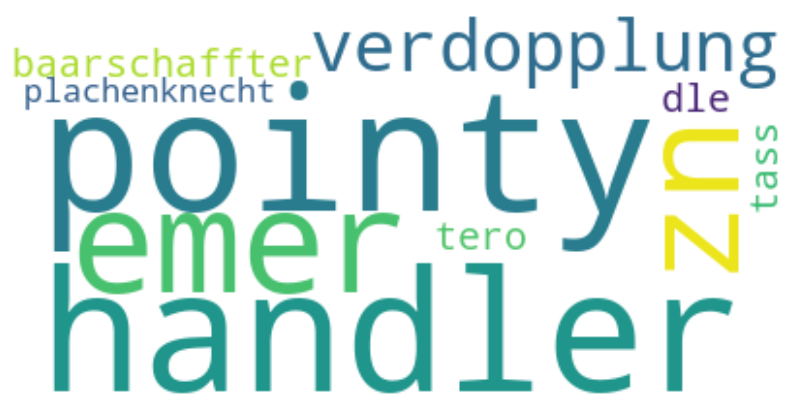

Topic 33:


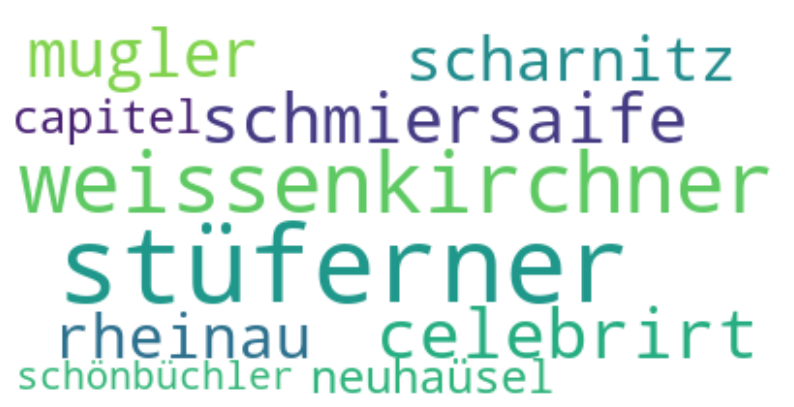

Topic 34:


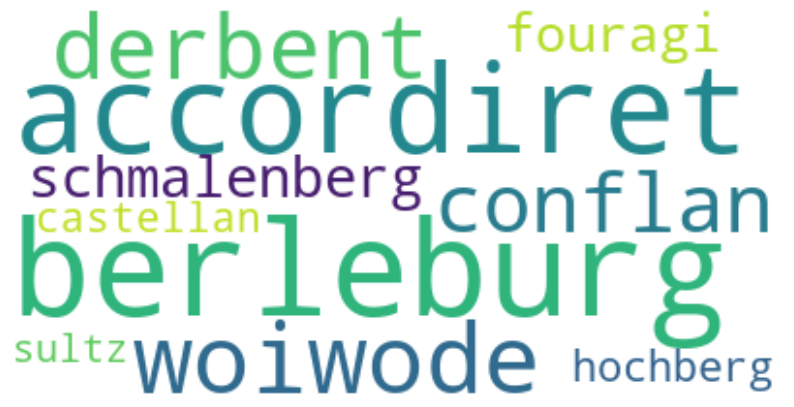

Topic 35:


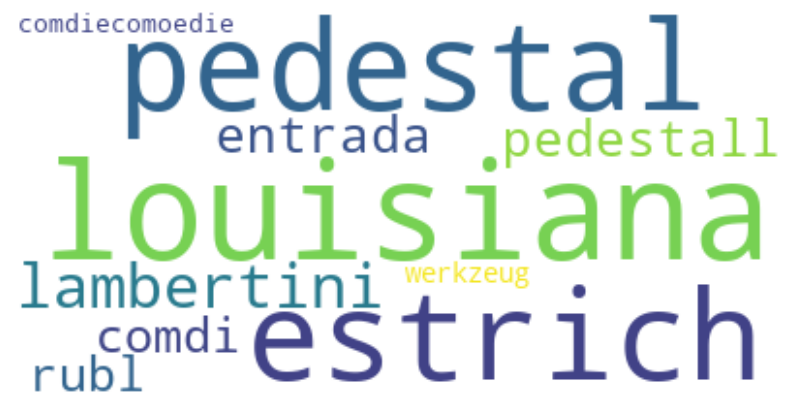

Topic 36:


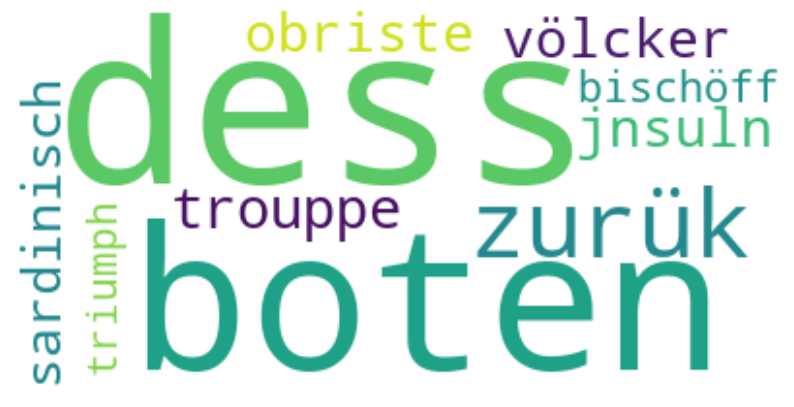

Topic 37:


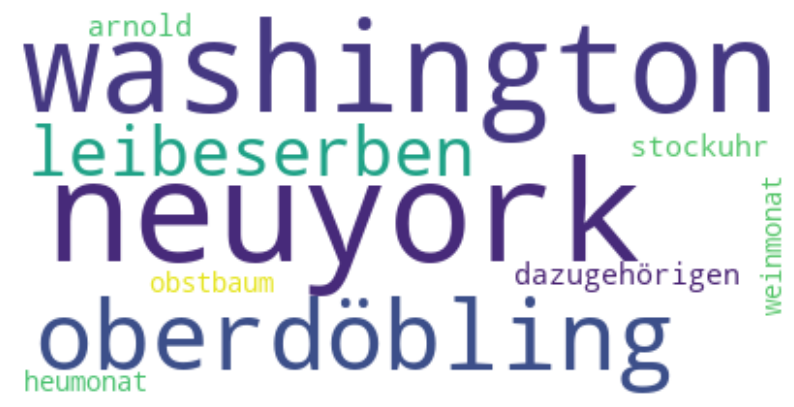

Topic 38:


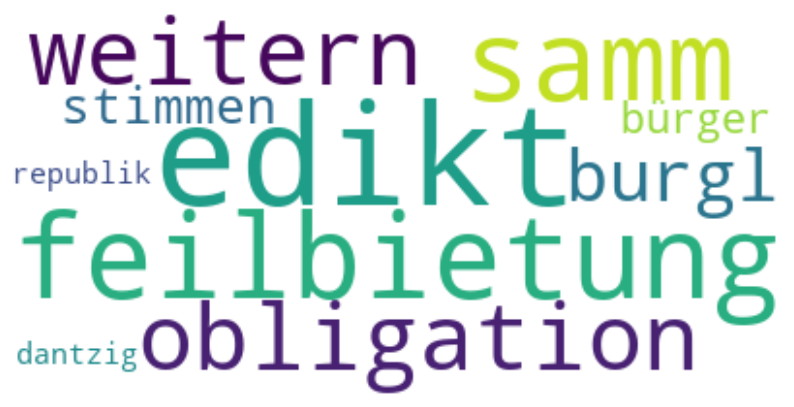

Topic 39:


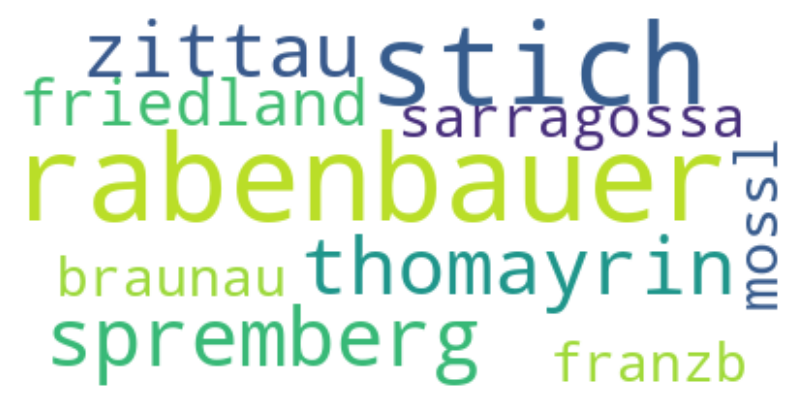

Topic 40:


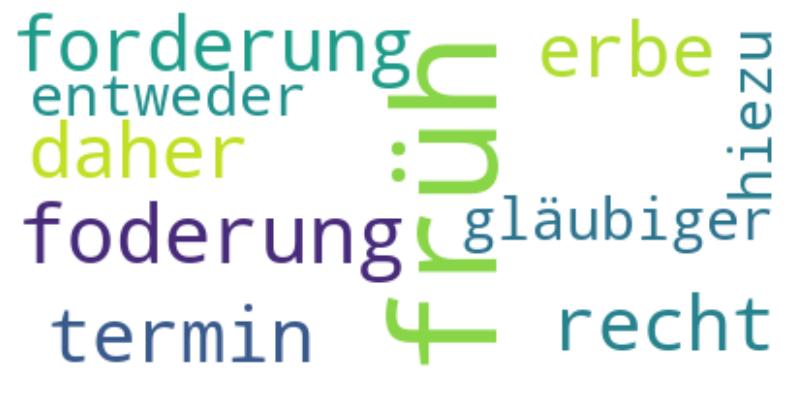

Topic 41:


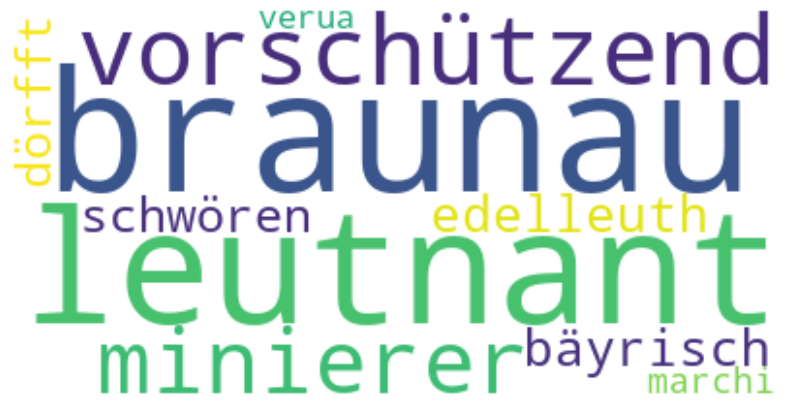

Topic 42:


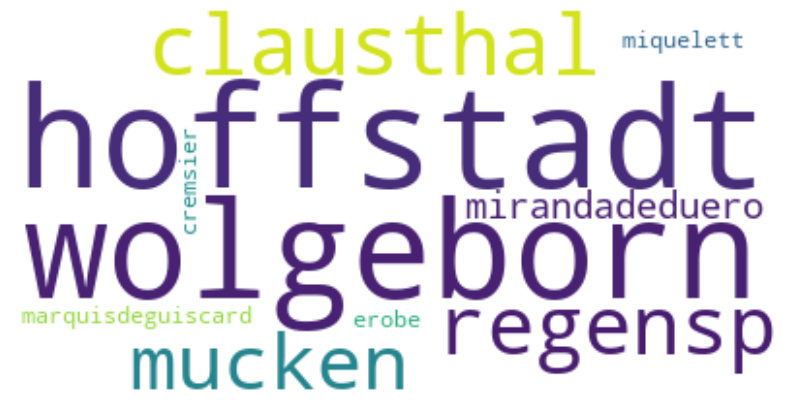

Topic 43:


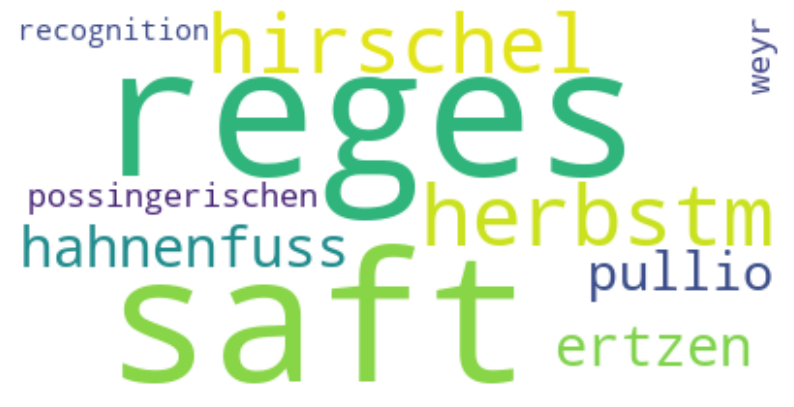

Topic 44:


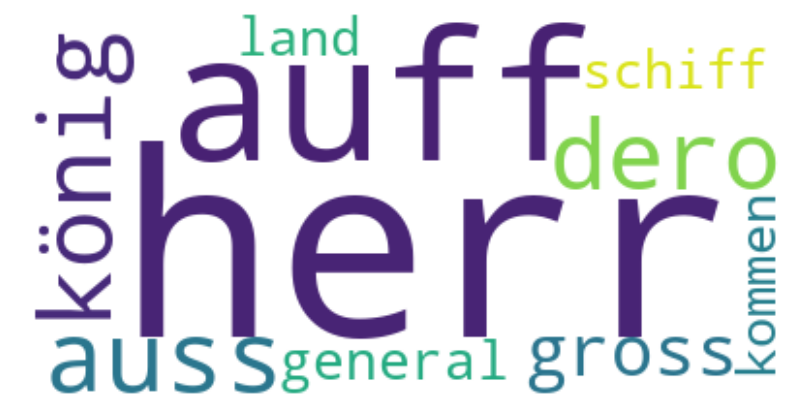

Topic 45:


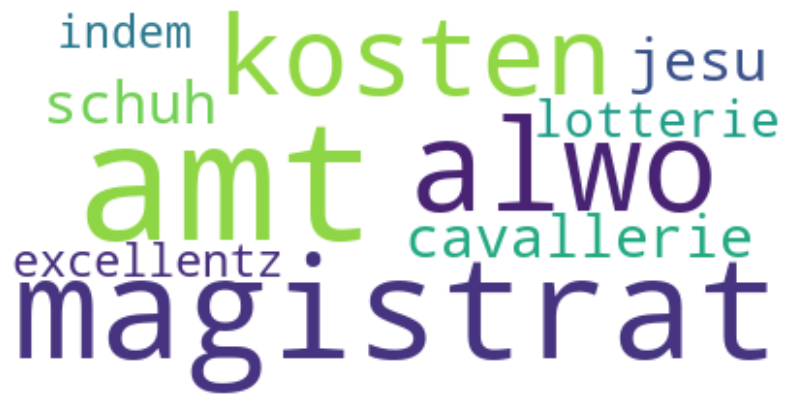

Topic 46:


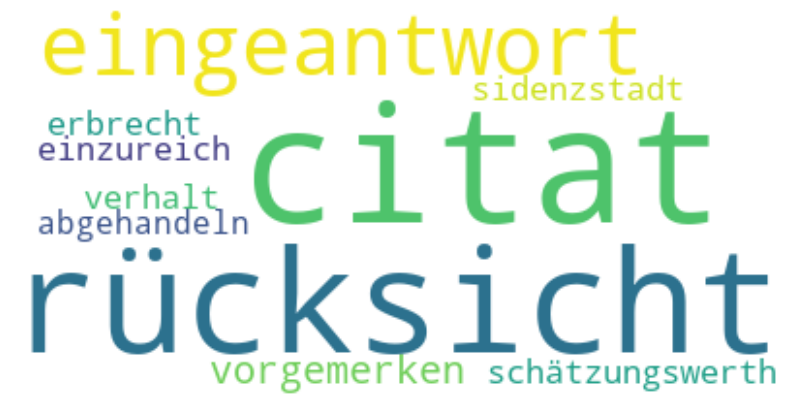

Topic 47:


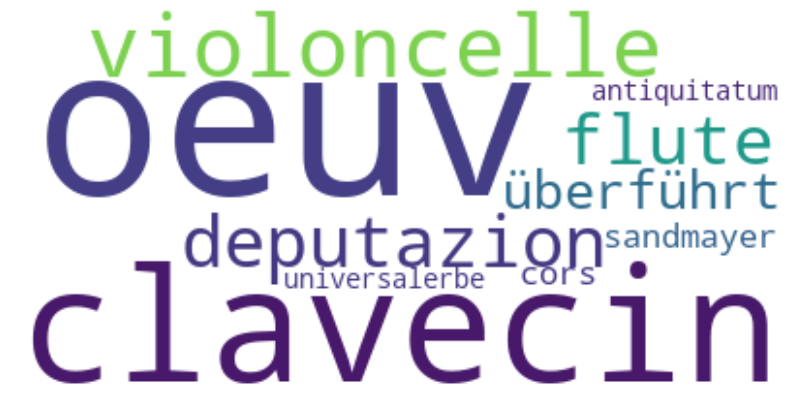

Topic 48:


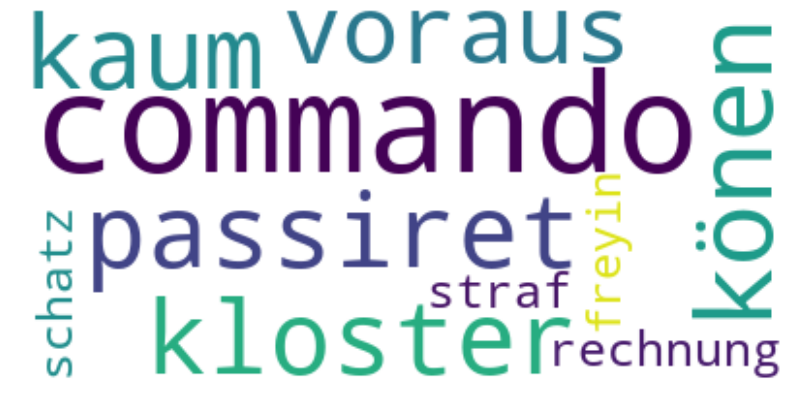

Topic 49:


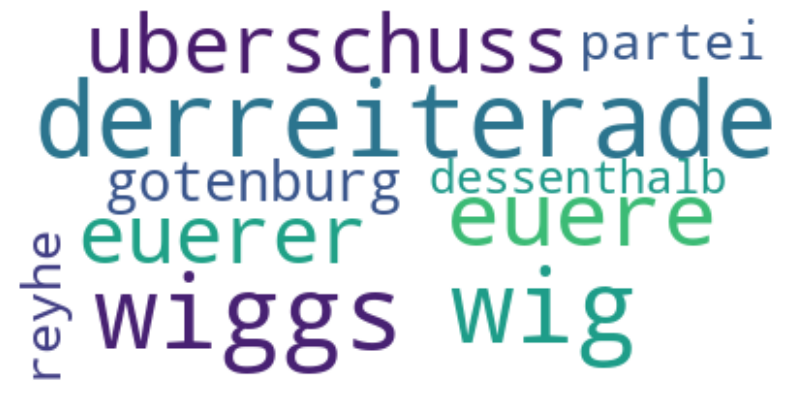

Topic 50:


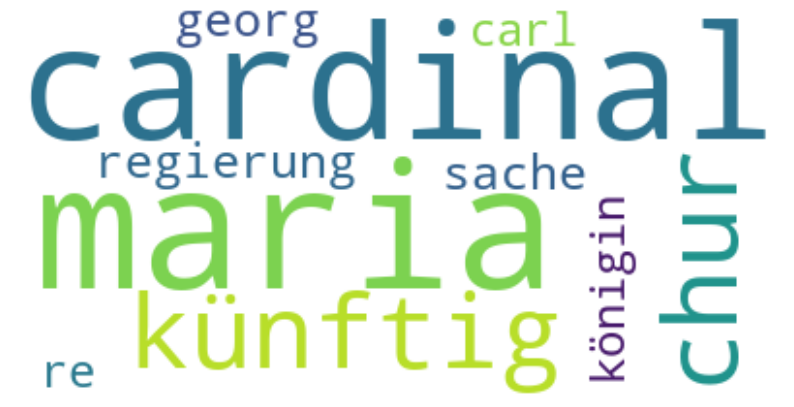

In [16]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def display_wordcloud(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx+1}:")

        # get the top words for this topic
        top_words = [feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]
        top_words_weights = sorted(topic)[:-no_top_words - 1:-1]
        
        # generate word cloud
        wordcloud_dict = {word: weight for word, weight in zip(top_words, top_words_weights)}
        wordcloud = WordCloud(background_color='white').generate_from_frequencies(wordcloud_dict)

        plt.figure(figsize=(10, 10))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()

no_top_words = 10  # change to get more or fewer top words

display_wordcloud(lda, feature_names, no_top_words)



Topic 1:


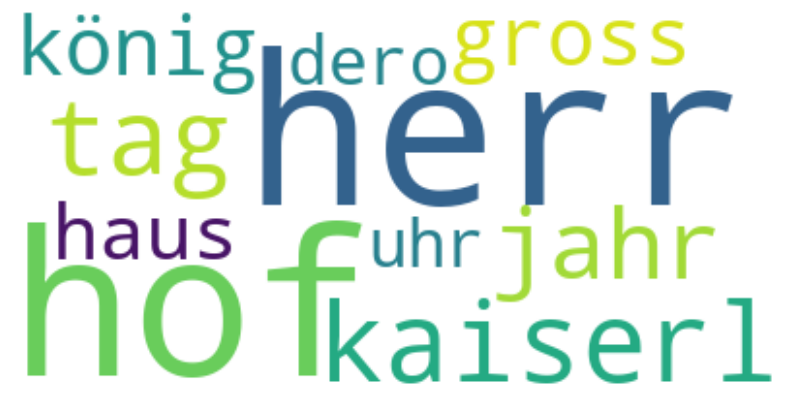

Topic 2:


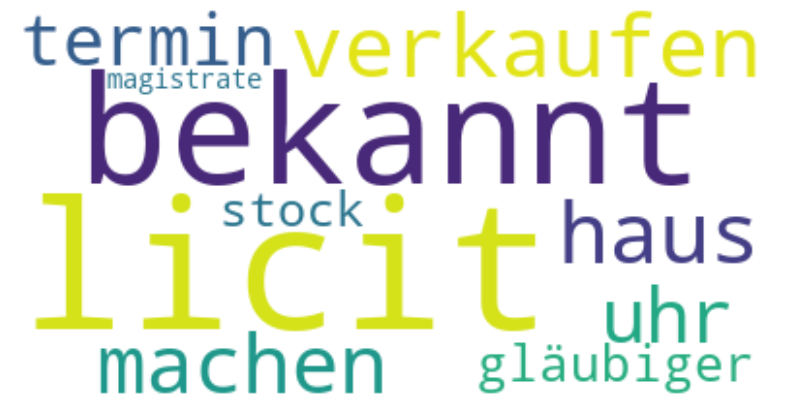

Topic 3:


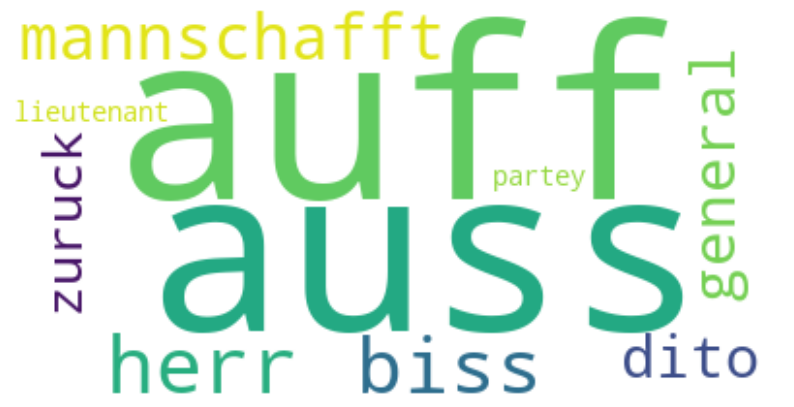

Topic 4:


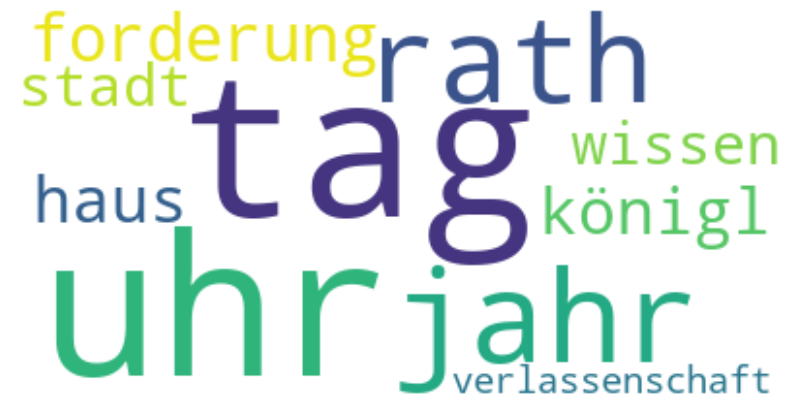

Topic 5:


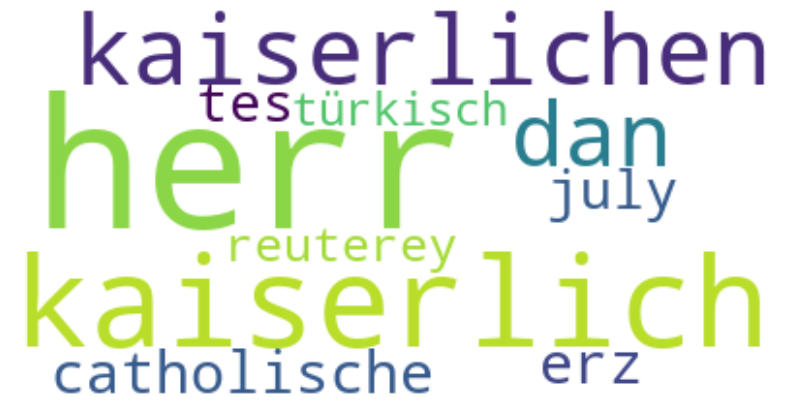

Topic 6:


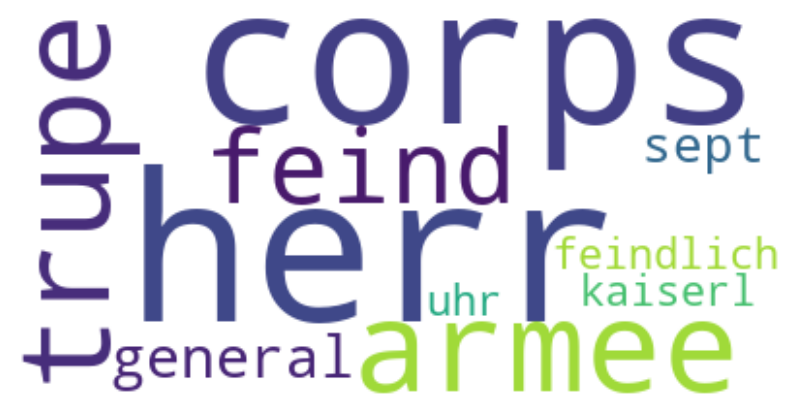

Topic 7:


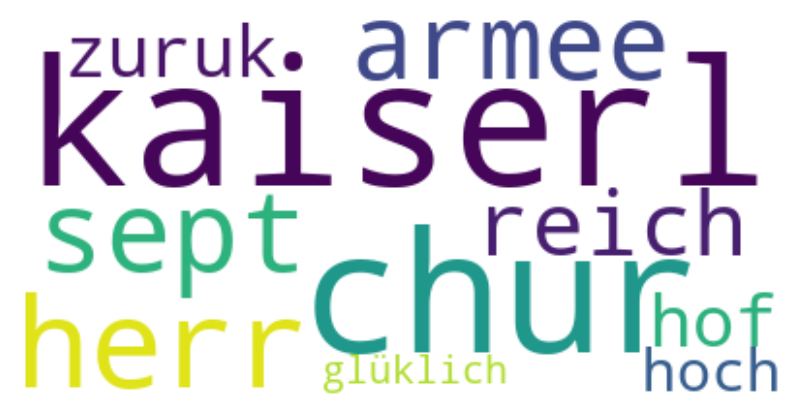

Topic 8:


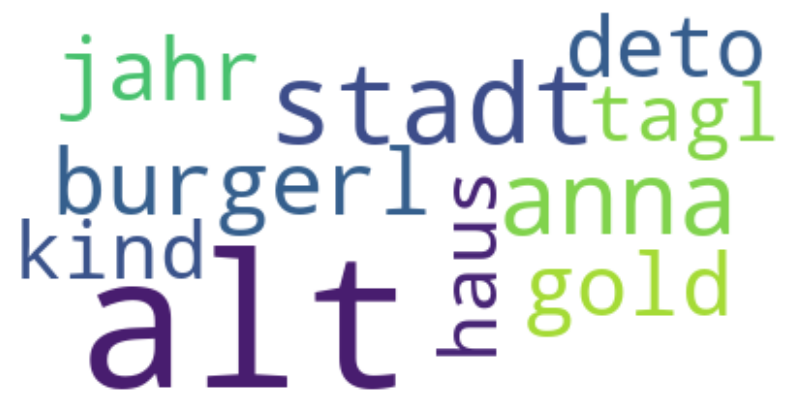

Topic 9:


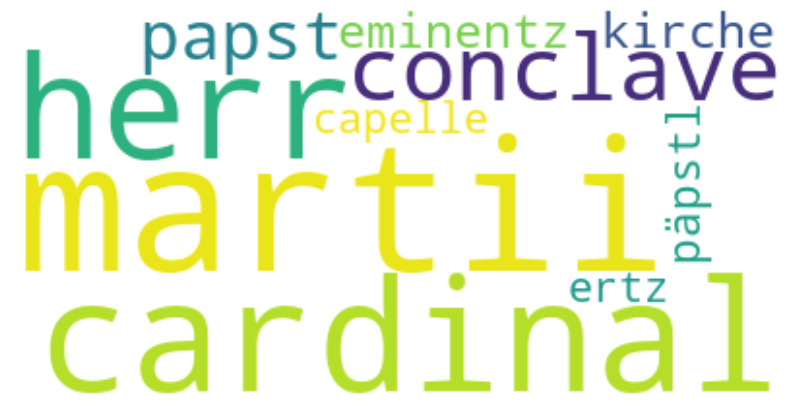

Topic 10:


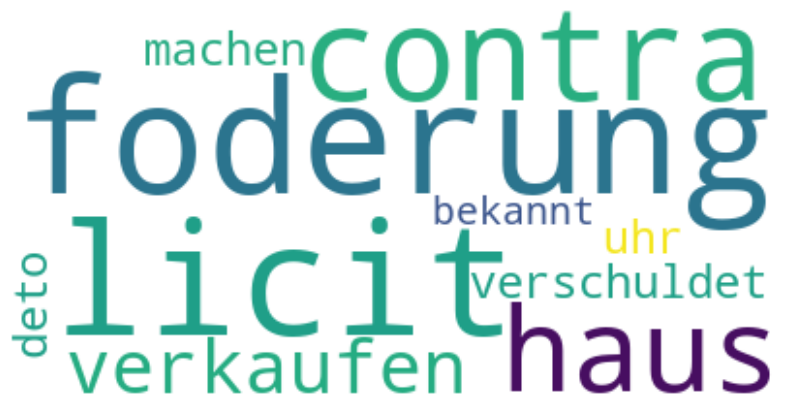

Topic 11:


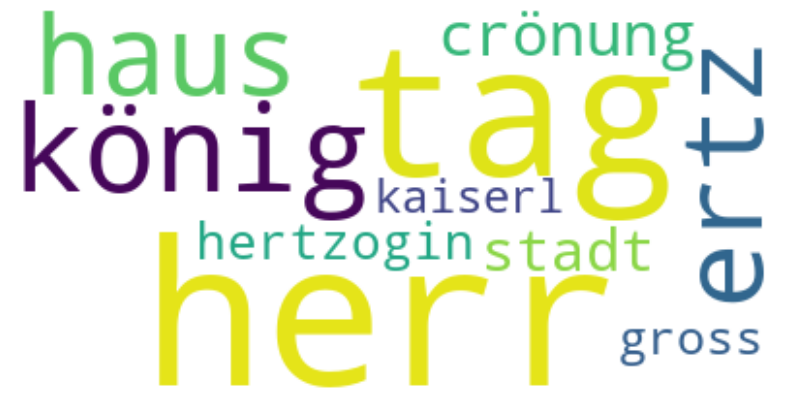

Topic 12:


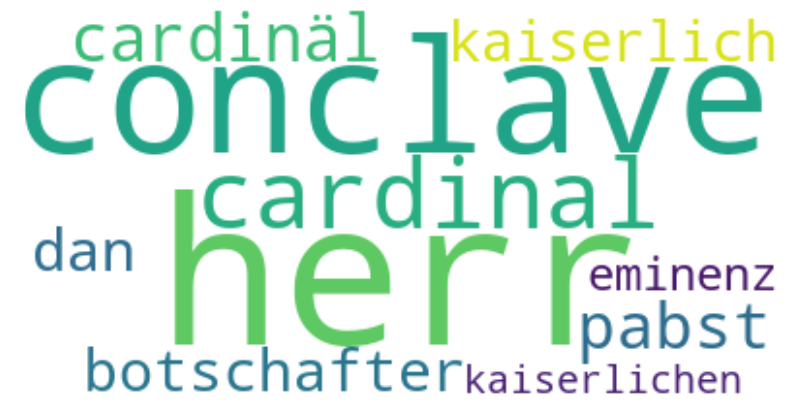

Topic 13:


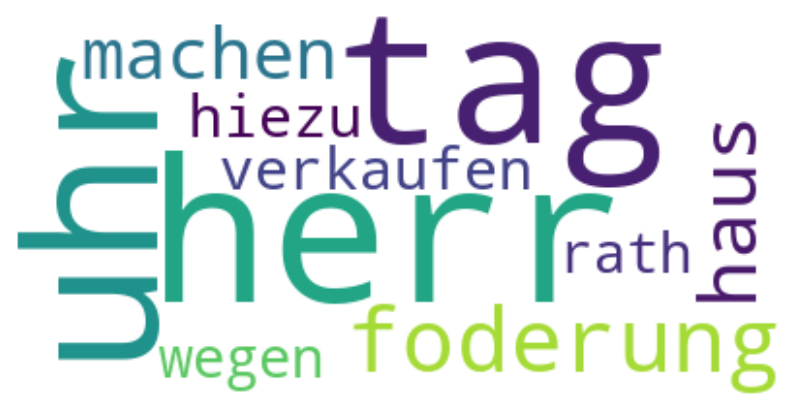

Topic 14:


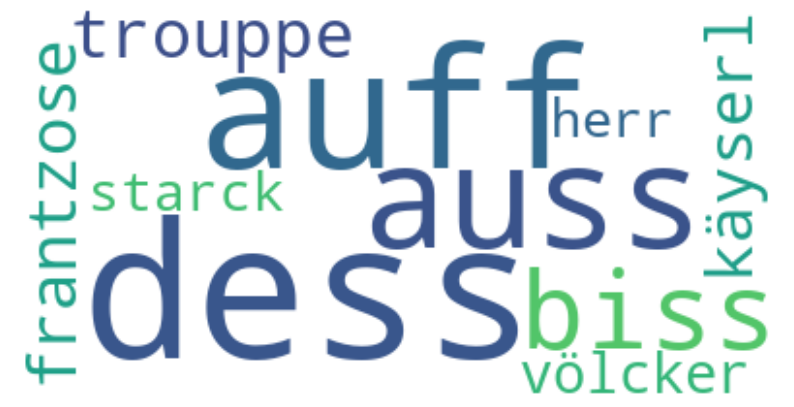

Topic 15:


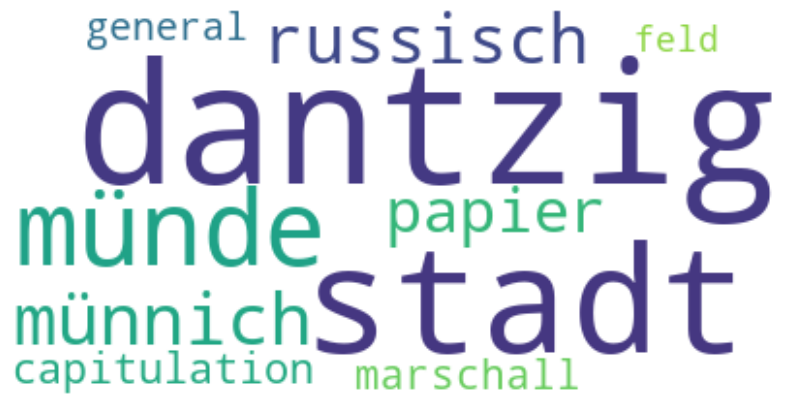

Topic 16:


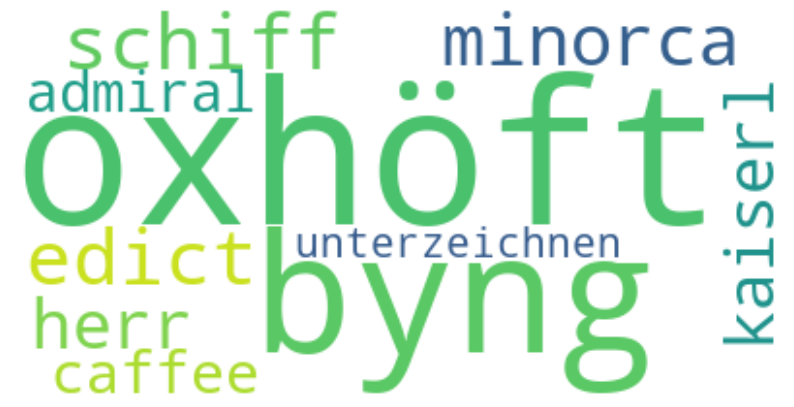

Topic 17:


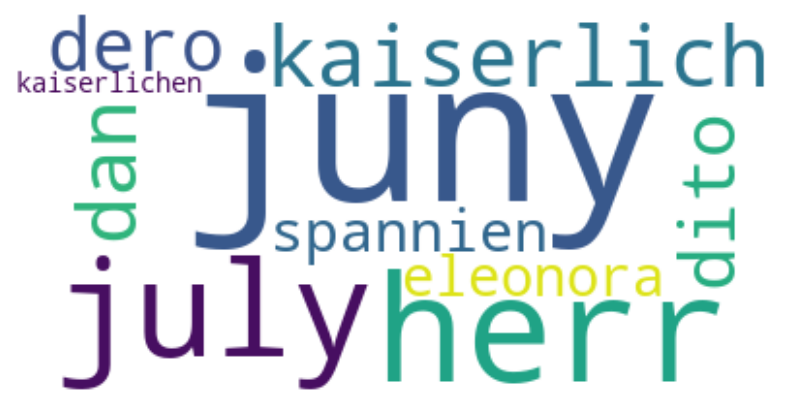

Topic 18:


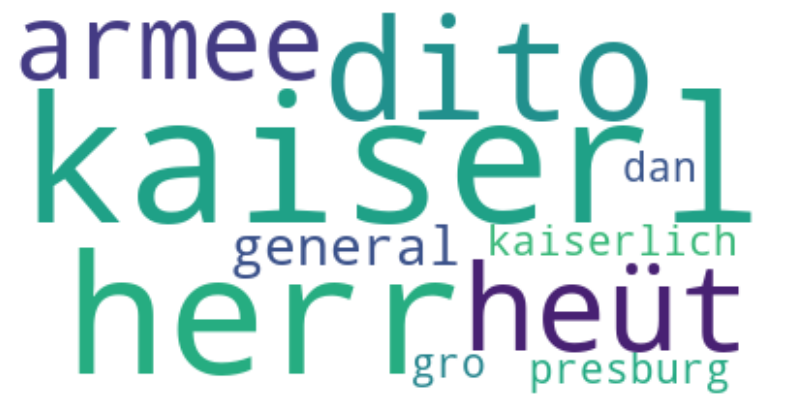

Topic 19:


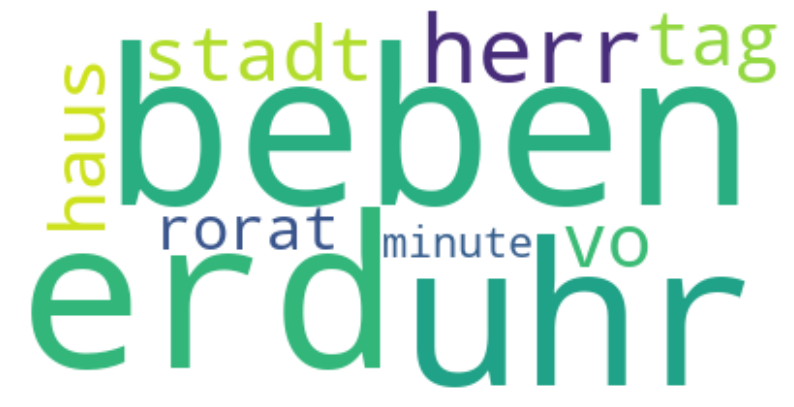

Topic 20:


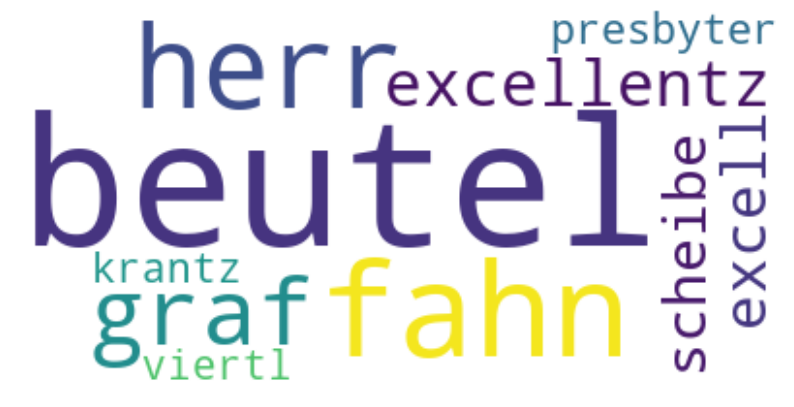

Topic 21:


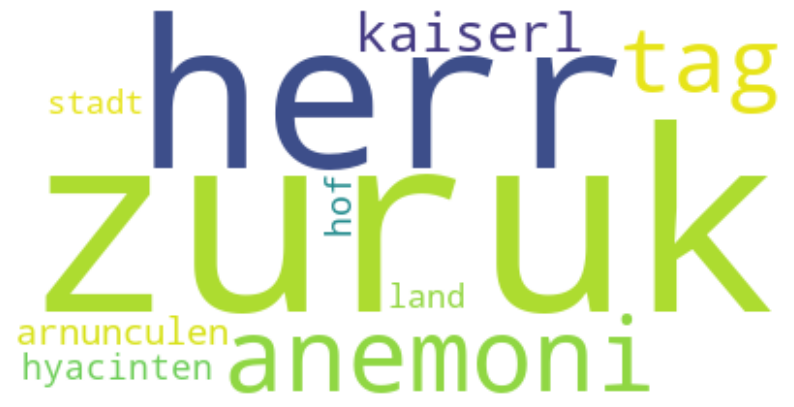

Topic 22:


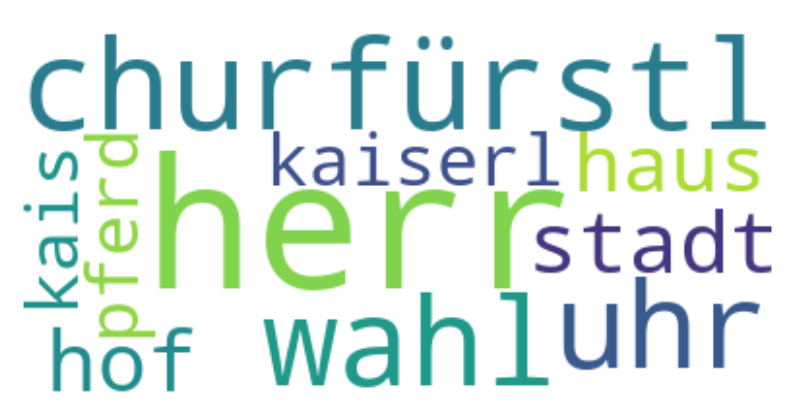

Topic 23:


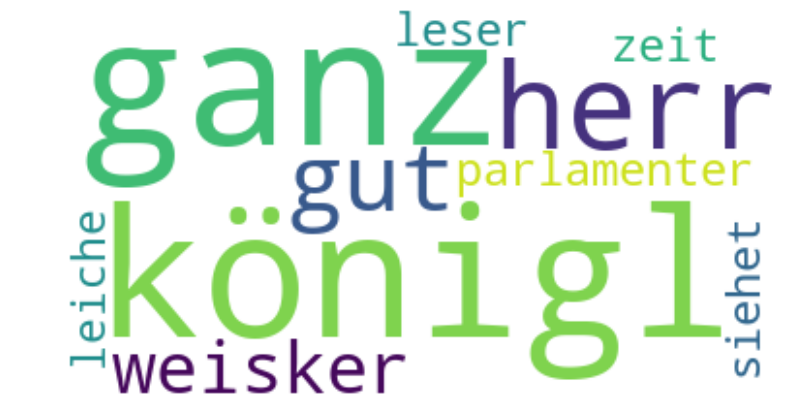

Topic 24:


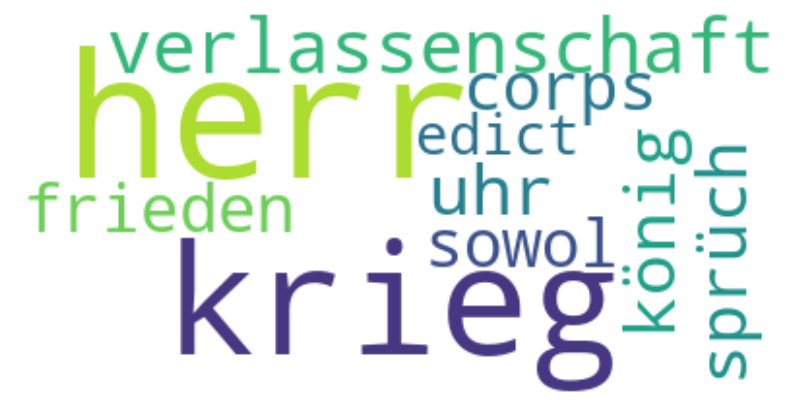

Topic 25:


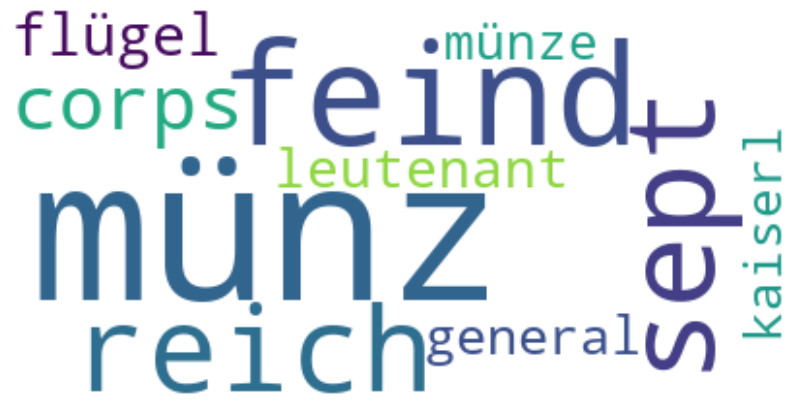

Topic 26:


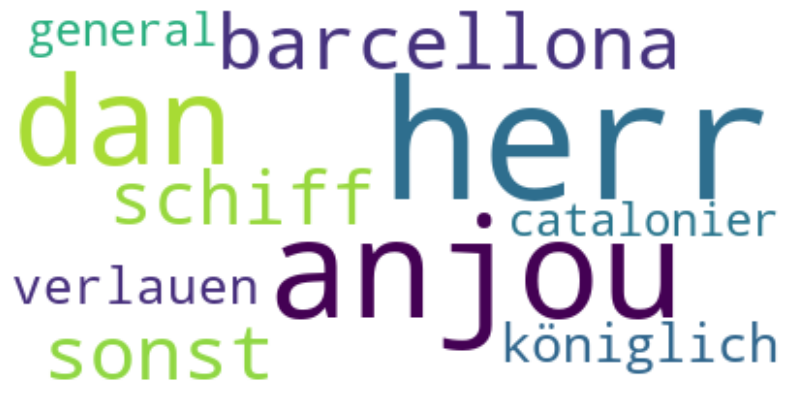

Topic 27:


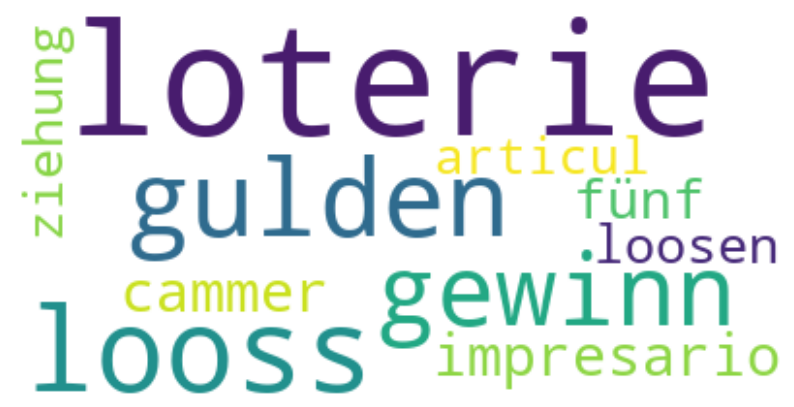

Topic 28:


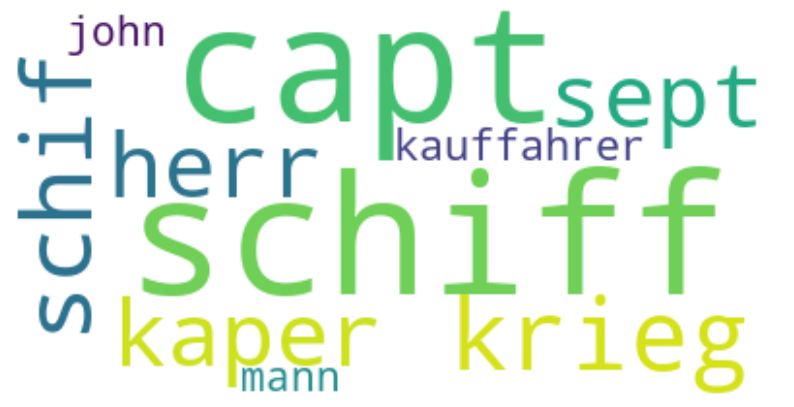

Topic 29:


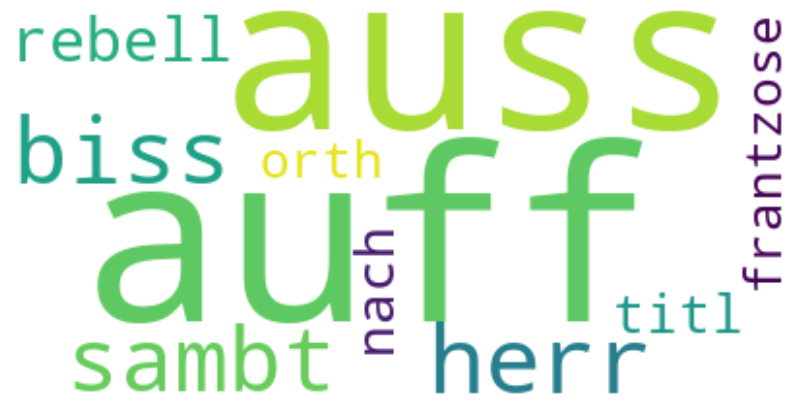

Topic 30:


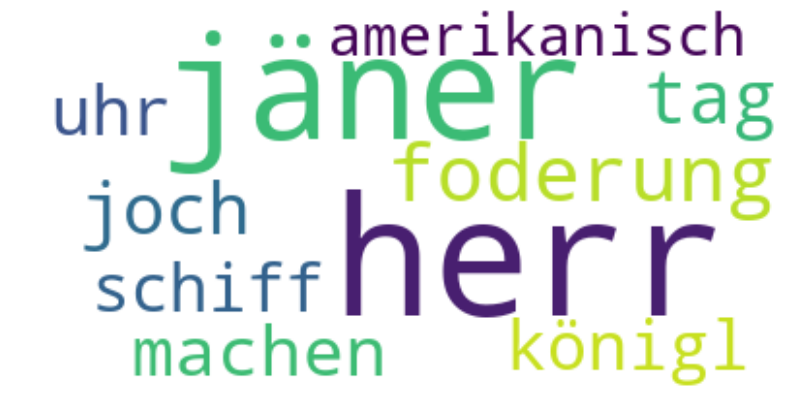

Topic 31:


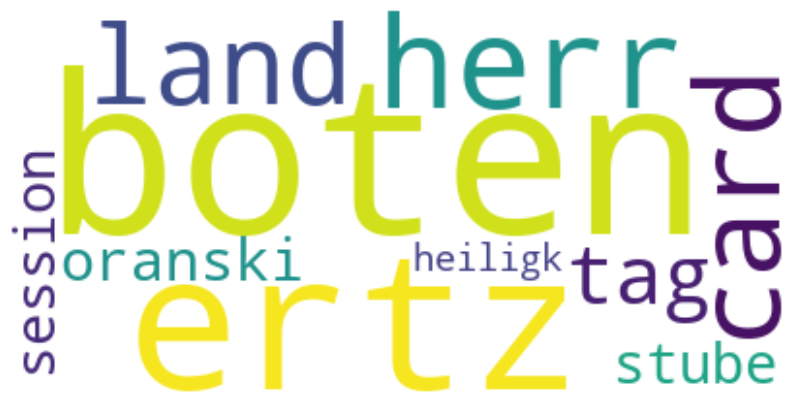

Topic 32:


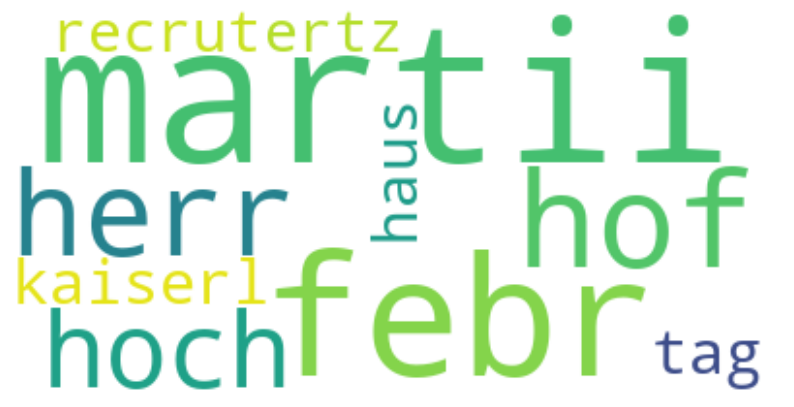

Topic 33:


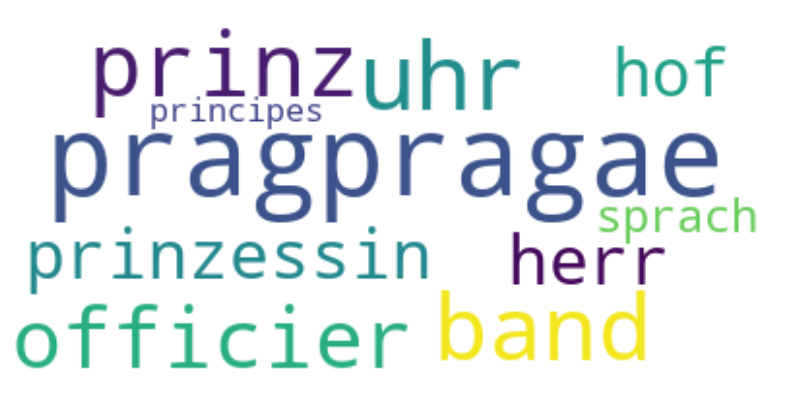

Topic 34:


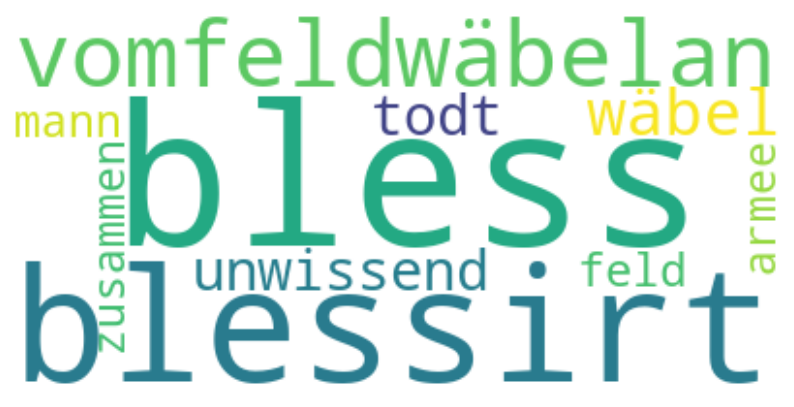

Topic 35:


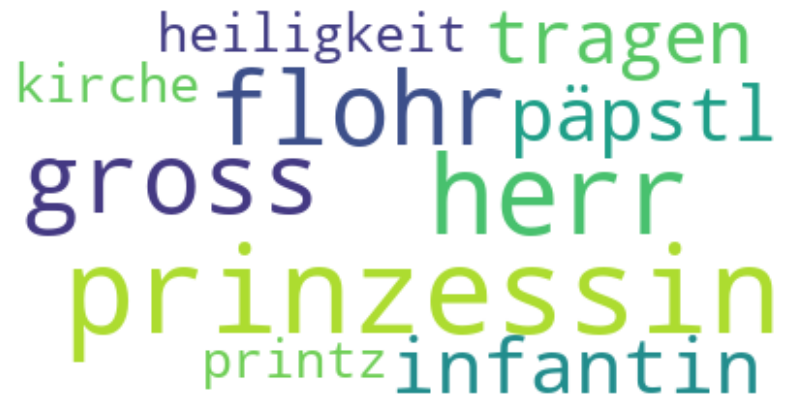

Topic 36:


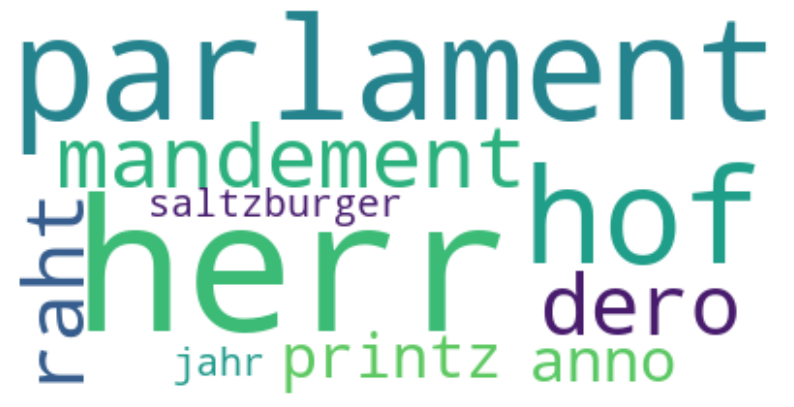

Topic 37:


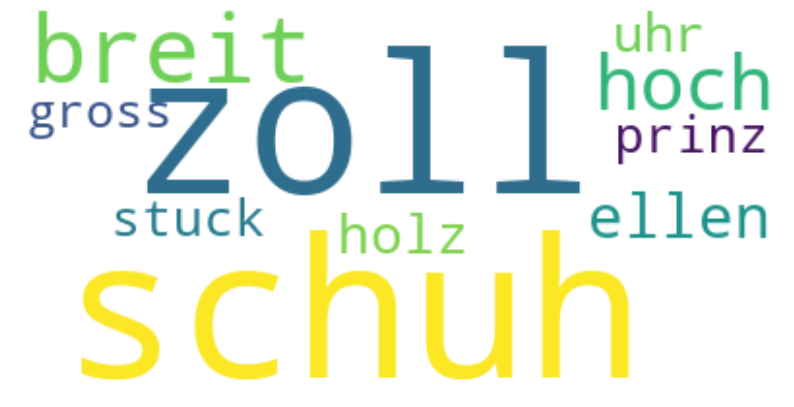

Topic 38:


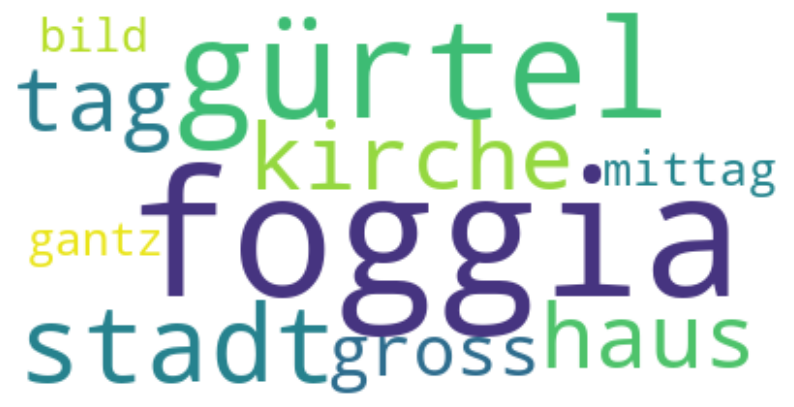

Topic 39:


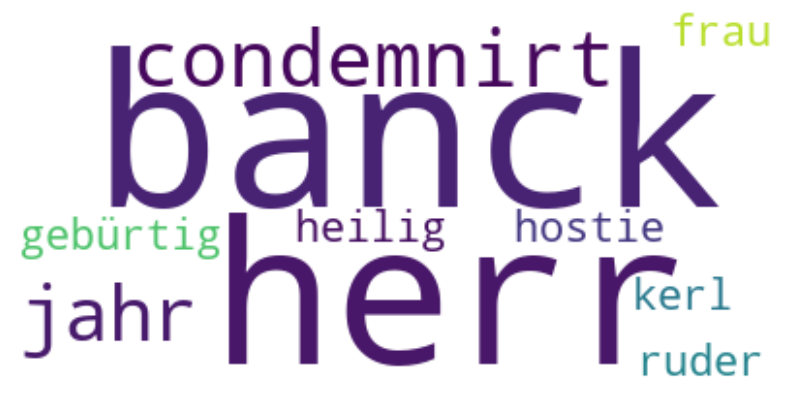

Topic 40:


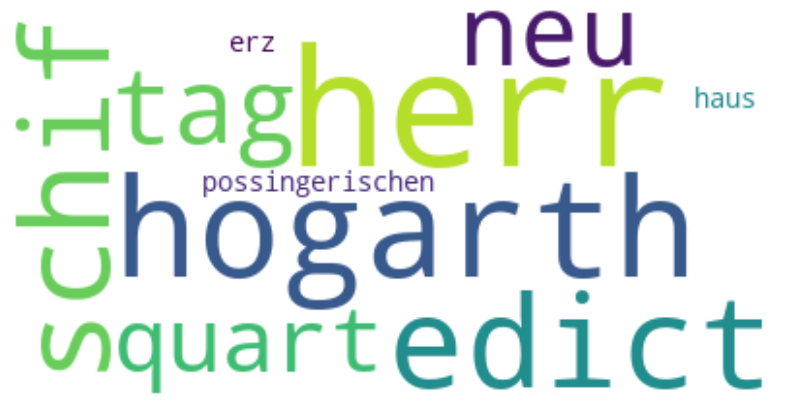

Topic 41:


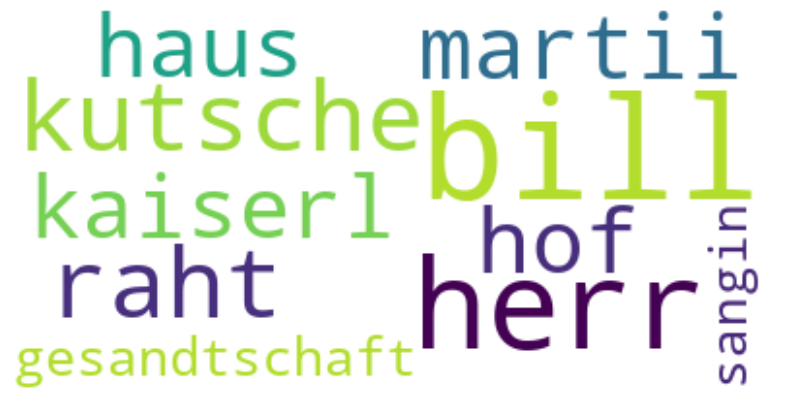

Topic 42:


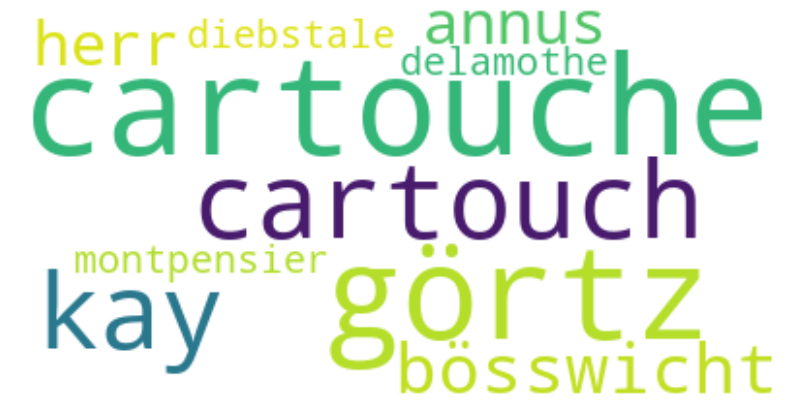

Topic 43:


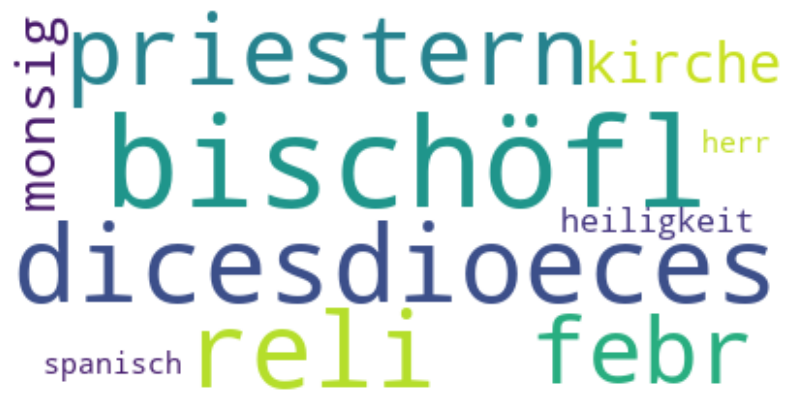

Topic 44:


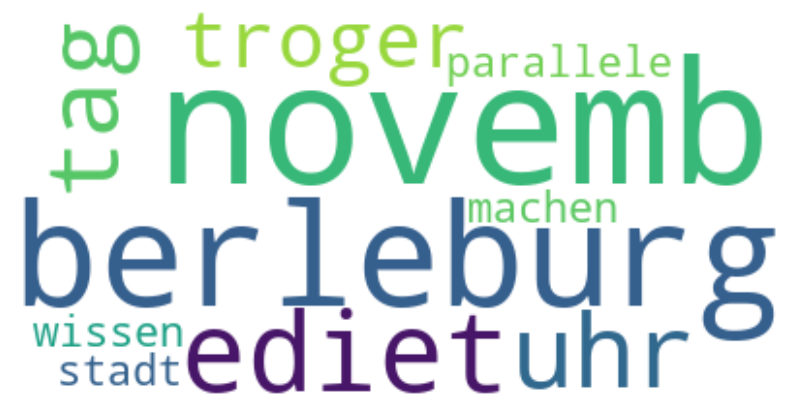

Topic 45:


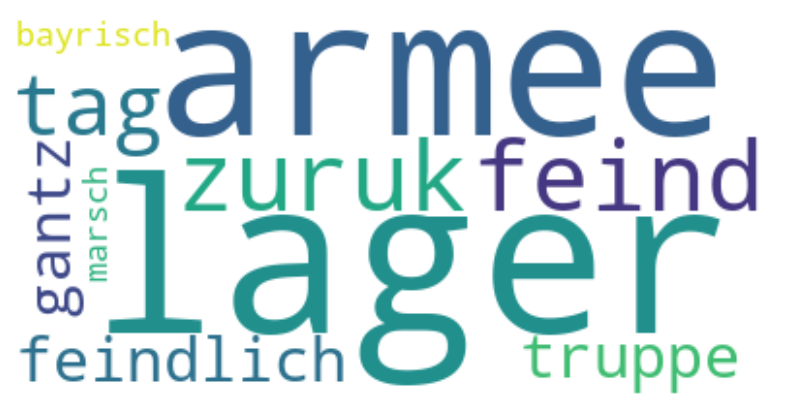

Topic 46:


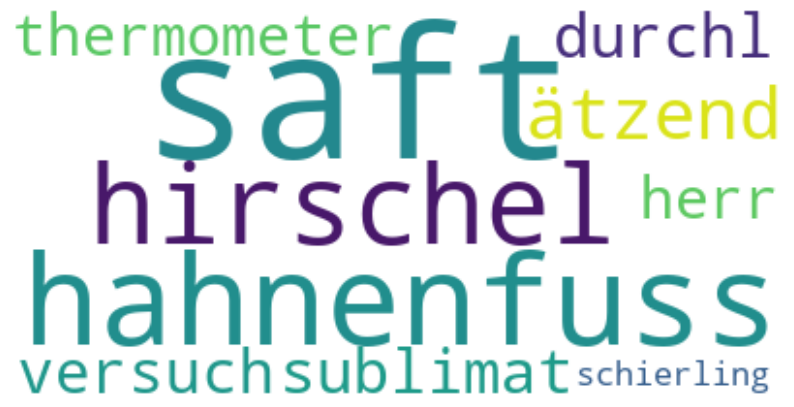

Topic 47:


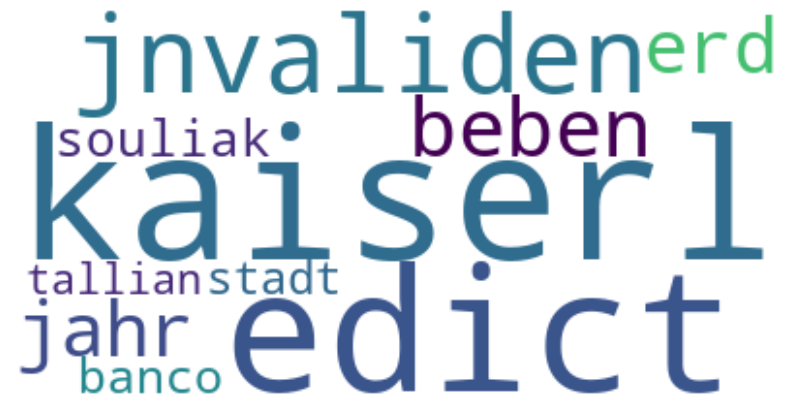

Topic 48:


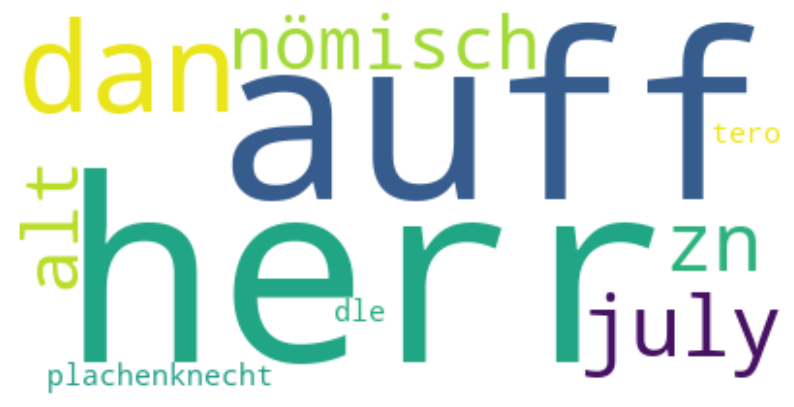

Topic 49:


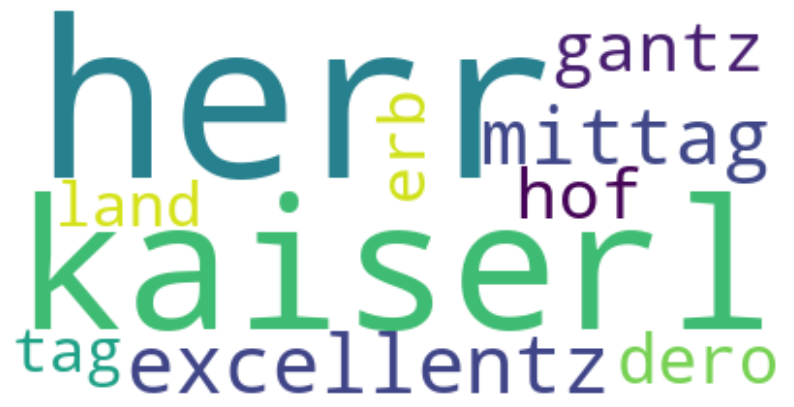

Topic 50:


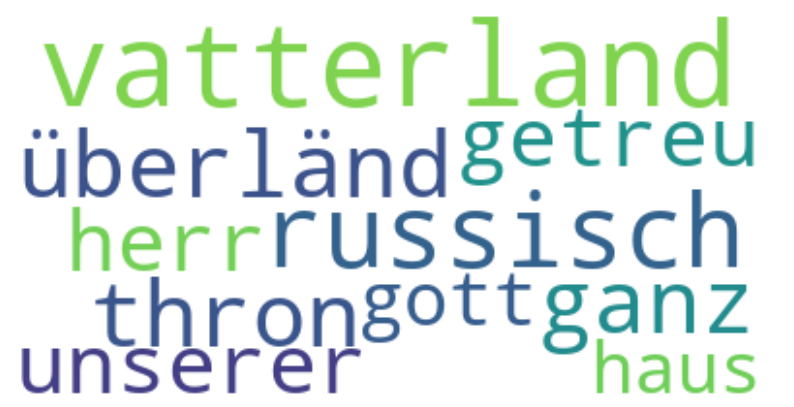

In [17]:
display_wordcloud(nmf, feature_names, no_top_words)

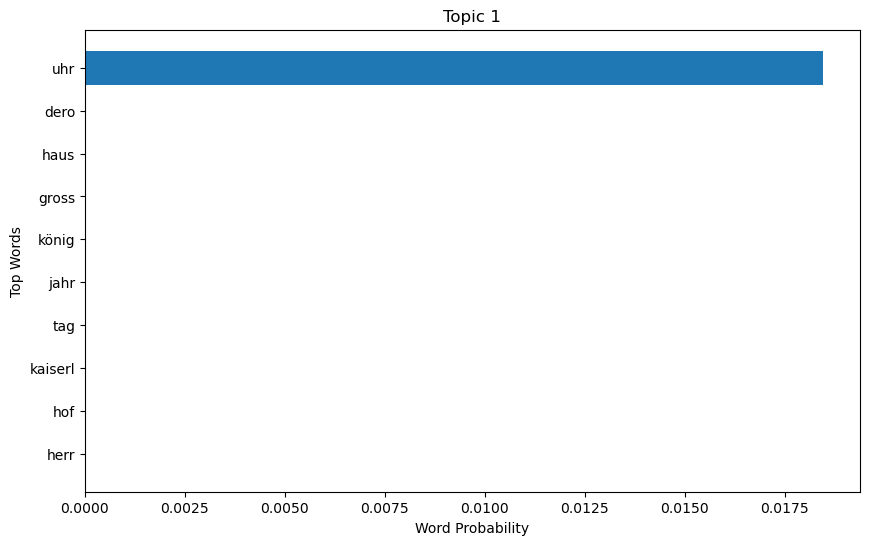

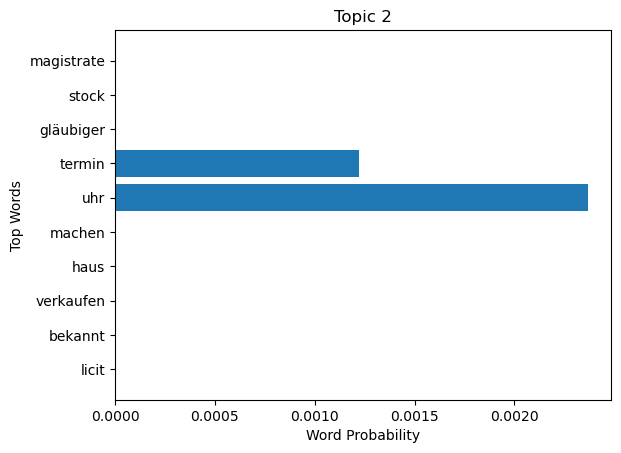

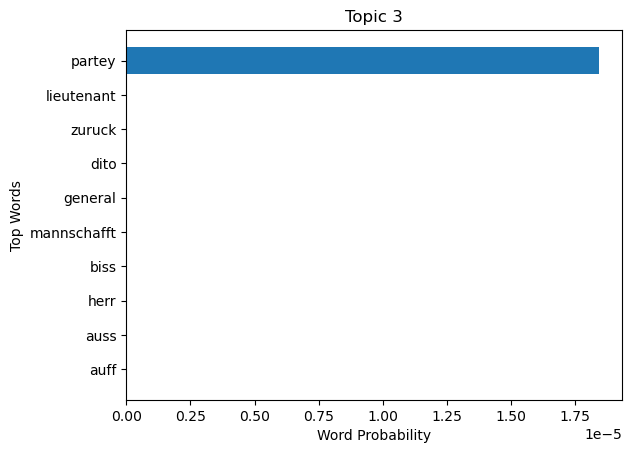

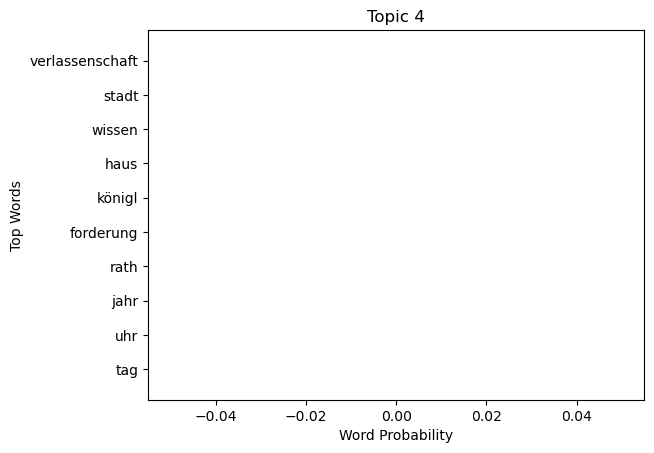

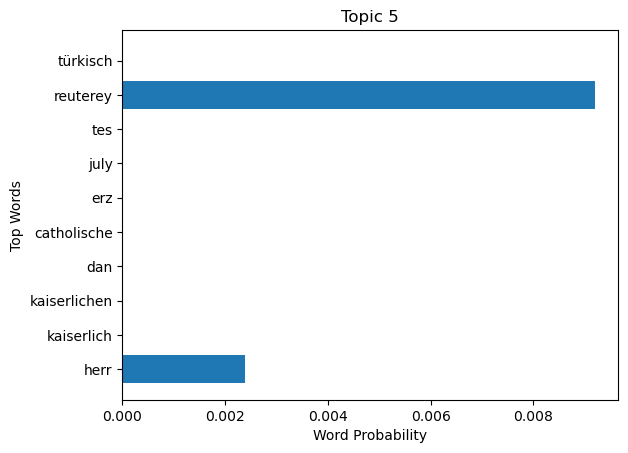

...

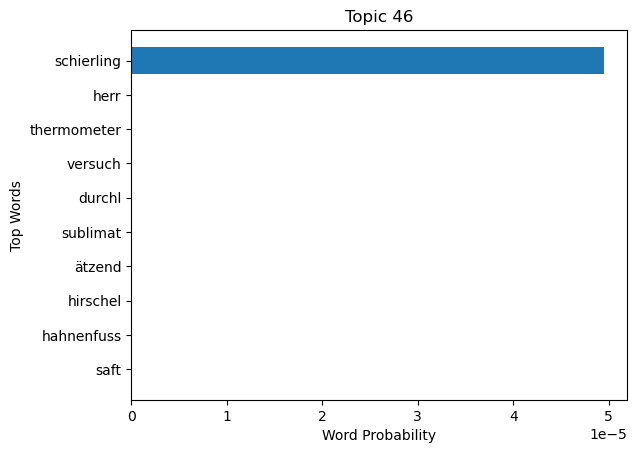

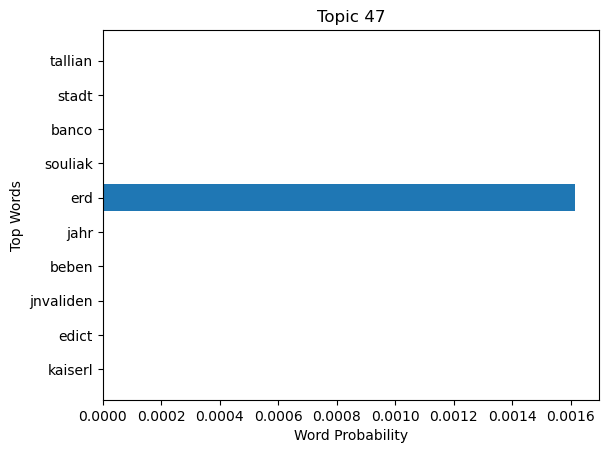

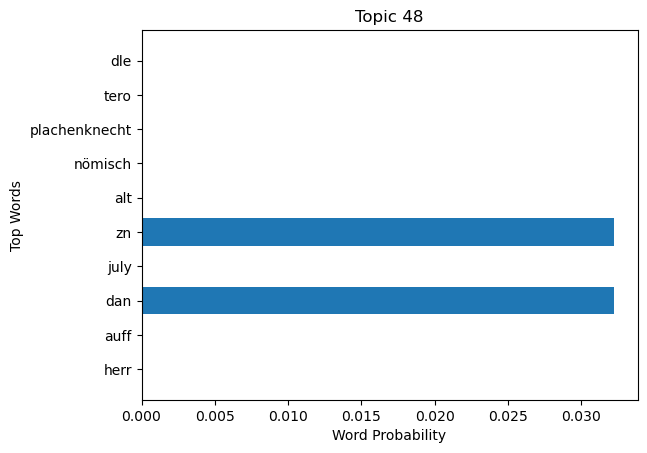

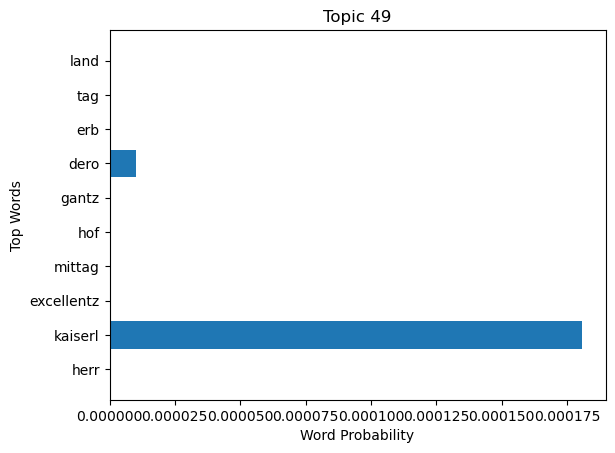

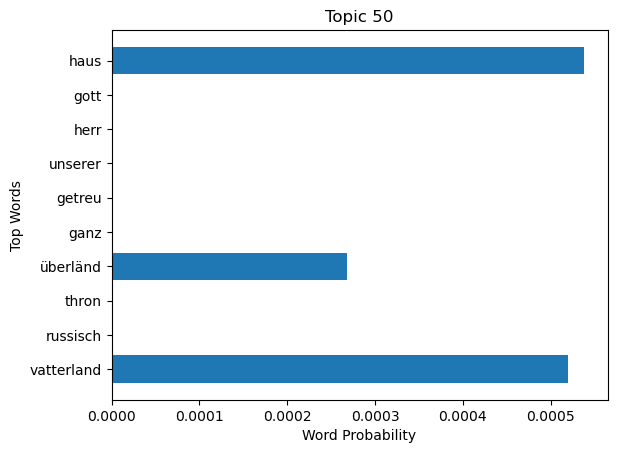

In [18]:
plt.figure(figsize=(10, 6))
for topic_idx, topic in enumerate(nmf.components_):
    top_words = [feature_names[i] for i in topic.argsort()[:-11:-1]]
    plt.barh(top_words, topic[:-11:-1])
    plt.title(f"Topic {topic_idx+1}")
    plt.xlabel("Word Probability")
    plt.ylabel("Top Words")
    plt.show()


In [29]:

# Function to extract topics from the model
def get_topics(model, feature_names, n_top_words):
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
        top_features = [feature_names[i] for i in top_features_ind]
        topics.append((topic_idx, ", ".join(top_features)))
    return topics



In [31]:
tfidf_feature_names = vectorizer.get_feature_names_out()


In [33]:
lda_topics = get_topics(lda, tfidf_feature_names, 10)
nmf_topics = get_topics(nmf, tfidf_feature_names, 10)


In [34]:
lda_df = pd.DataFrame(lda_topics, columns=['Topic', 'Words'])
nmf_df = pd.DataFrame(nmf_topics, columns=['Topic', 'Words'])


In [35]:
print("LDA Topics:")
print(lda_df)


LDA Topics:
    Topic                                              Words
0       0  kaiserin, kaiserlichen, römisch, sept, allergn...
1       1  grossen, schrift, sol, wohnen, canon, darzu, h...
2       2  hochzeit, dichen, beylager, nachstens, zockel,...
3       3  gürtel, lemma, emblema, hofmannisch, conflans,...
4       4  rathstag, licitationstagsatzung, sässen, könig...
5       5  troger, barcasse, bill, ordeville, valkenier, ...
6       6  loterie, zepter, impresario, centig, castellan...
7       7  helsingburg, reventlau, reyst, wolffarth, fodo...
8       8  balaguer, neuhäusel, ebetzky, bertamont, zuver...
9       9  appell, cont, ausnehmend, affigirung, fürgewes...
10     10  pränumeration, sachwalter, sir, fox, anzuordn,...
11     11  amtskanzley, convoc, erbschaft, wiese, verlauf...
12     12  wiesenthal, marquisdemonti, leuthner, reisinge...
13     13  münde, vermählet, macher, köstlich, tambour, s...
14     14  foggia, oldendorf, luckner, schleier, eimbeck,...
15     15  a

In [36]:
nmf_df = pd.DataFrame(nmf_topics, columns=['Topic', 'Words'])


In [39]:
nmf_df.to_csv('nmf_topics.csv', encoding='utf-8')

In [40]:
lda_df.to_csv('lda_topics.csv', encoding='utf-8')

In [37]:
print("\nNMF Topics:")
print(nmf_df)



NMF Topics:
    Topic                                              Words
0       0  herr, hof, kaiserl, tag, jahr, könig, gross, h...
1       1  licit, bekannt, verkaufen, haus, machen, uhr, ...
2       2  auff, auss, herr, biss, mannschafft, general, ...
3       3  tag, uhr, jahr, rath, forderung, königl, haus,...
4       4  herr, kaiserlich, kaiserlichen, dan, catholisc...
5       5  herr, corps, armee, trupe, feind, general, sep...
6       6  kaiserl, chur, herr, sept, armee, reich, zuruk...
7       7  alt, stadt, anna, burgerl, jahr, gold, deto, h...
8       8  martii, cardinal, herr, conclave, papst, emine...
9       9  foderung, licit, contra, haus, verkaufen, vers...
10     10  herr, tag, könig, ertz, haus, crönung, stadt, ...
11     11  herr, conclave, cardinal, cardinäl, pabst, dan...
12     12  herr, tag, uhr, foderung, haus, machen, verkau...
13     13  dess, auff, auss, biss, trouppe, frantzose, kä...
14     14  dantzig, stadt, münde, münnich, russisch, papi...
15     15  

## Evaluation of models 
* testing out different evalaution metrics, coherence for LDA and NMF, perplexity for LDA and reconstruction error for NMF

In [19]:
def get_topics_sklearn(model, vectorizer, n_top_words):
    words = vectorizer.get_feature_names_out()
    topics = []
    for topic_idx, topic in enumerate(model.components_):
        topic_words = [words[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        topics.append(topic_words)
    return topics

In [20]:
lda_topics = get_topics_sklearn(lda, vectorizer, 10)
nmf_topics = get_topics_sklearn(nmf, vectorizer, 10)

In [21]:
nltk.download('stopwords')
stop_words = stopwords.words('german')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\krusic\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [22]:
texts = texts_df.text.to_list()

In [23]:
def preprocess(text):
    return [token for token in gensim.utils.simple_preprocess(text) if token not in stop_words]

# Apply preprocessing
processed_docs = [preprocess(text) for text in texts]


In [24]:
dictionary = Dictionary(processed_docs)
corpus = [dictionary.doc2bow(doc) for doc in processed_docs]


In [25]:
coherence_model_lda = CoherenceModel(topics=lda_topics, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(f'LDA Coherence Score: {coherence_lda}')


LDA Coherence Score: 0.38013900174868753


In [26]:
coherence_model_nmf = CoherenceModel(topics=nmf_topics, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_nmf = coherence_model_nmf.get_coherence()
print(f'NMF Coherence Score: {coherence_nmf}')

NMF Coherence Score: 0.4900658116864506


- The NMF model has a higher coherence score (0.4901) compared to the LDA model (0.3801), indicating that NMF is producing more coherent and interpretable topics for the DIGITARIUM dataset


In [10]:
lda_perplexity = lda.perplexity(vectorized_text)
lda_perplexity

2317981461114.4443

In [12]:
nmf_reconstruction_err = nmf.reconstruction_err_
nmf_reconstruction_err

12.973180641031048

In [13]:
print(f"LDA Perplexity: {lda_perplexity}")
print(f"NMF Reconstruction Error: {nmf_reconstruction_err}")


LDA Perplexity: 2317981461114.4443
NMF Reconstruction Error: 12.973180641031048


In [13]:
def compute_topic_diversity(model, feature_names, top_n=10):
    topic_words = []
    for topic in model.components_:
        top_indices = topic.argsort()[::-1][:top_n]
        top_terms = [feature_names[i] for i in top_indices]
        topic_words.append(top_terms)
    all_words = sum(topic_words, [])
    unique_words = set(all_words)
    return round(len(unique_words) / (len(topic_words) * top_n), 3)




In [10]:
# 2. Load the NMF model
with open('models/nmf_model.pkl', 'rb') as f:
    nmf_model = pickle.load(f)

C:\Users\krusic\AppData\Local\anaconda3\Lib\site-packages\sklearn\base.py:318: UserWarning: Trying to unpickle estimator NMF from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [12]:
with open('models/lda_model.pkl', 'rb') as f:
    lda_model = pickle.load(f)

C:\Users\krusic\AppData\Local\anaconda3\Lib\site-packages\sklearn\base.py:318: UserWarning: Trying to unpickle estimator LatentDirichletAllocation from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [16]:


diversity = compute_topic_diversity(lda_model, feature_names, top_n=10)
print(f"📊 LDA topic diversity: {diversity}")


📊 LDA topic diversity: 0.986


In [17]:
diversity_nmf = compute_topic_diversity(nmf_model, feature_names, top_n=10)
print(f"📊 NMF topic diversity: {diversity_nmf}")


📊 NMF topic diversity: 0.568


LDA Perplexity: Perplexity is a commonly used evaluation metric for topic models, including LDA. It measures how well the model predicts the observed data. Lower perplexity values indicate better model performance. In your case, the LDA Perplexity is quite high, with a value of 2870345.557154866. This suggests that the LDA model is not able to effectively capture the underlying patterns and structure in the data. It might be a sign that the chosen number of topics or the quality of the text data could be further improved.

NMF Reconstruction Error: Reconstruction error is an evaluation metric specific to non-negative matrix factorization (NMF). It measures the dissimilarity between the original data and its approximation reconstructed by the NMF model. Lower reconstruction error values indicate better model performance. In your case, the NMF Reconstruction Error is 13.903349263716057. This suggests that the NMF model has achieved a relatively low level of error in reconstructing the original data.

It's important to note that these evaluation metrics alone might not provide a comprehensive understanding of the topic models' performance. It's recommended to consider other factors such as topic coherence, interpretability of the generated topics, and qualitative assessment of the results to assess the quality and meaningfulness of the topics produced by the models.

